# Projet 5 : Segmentez des clients d'un site e-commerce


Votre mission est d’aider les équipes d’Olist à comprendre les différents types d'utilisateurs. Vous utiliserez donc des méthodes non supervisées pour regrouper des clients de profils similaires. Ces catégories pourront être utilisées par l’équipe Marketing pour mieux communiquer.


# Modélisation

<a id="0"></a> <br>
# Table of Contents 

1. [Premières observations](#1)
2. [Segmentation RFM](#2)
    * [2.1 Construction du dataframe](#3)
    * [2.2 K-means](#4)
        * [2.2.1 KElbowVisualizer](#5)
        * [2.2.2 Silhouette Visualizer](#6)
        * [2.2.3 Distance intercluster](#7)
        * [2.2.4 Caractéristiques métiers des différents clustering](#8)
    * [2.3 DBSCAN](#9)
    * [2.4 Classification Ascendante hierarchique (CAH)](#10)
3. [Segmentation RFM + score](#11) 
    * [3.1 KElbowVisualizer](#12)
    * [3.2 Silhouette Visualizer](#13)
    * [3.3 Distance intercluster](#14)
    * [3.4 Caractéristiques métiers des différents clustering](#15)
4. [Segmentation RFM + score + livraison](#16)
    * [4.1 KElbowVisualizer](#17)
    * [4.2 Silhouette Visualizer](#18)
    * [4.3 Distance intercluster](#19)
    * [4.4 Caractéristiques métiers des différents clustering](#20)
5. [Segmentation avec l'ensemble du dataframe](#21)
    * [5.1 KElbowVisualizer](#22)
    * [5.2 Silhouette Visualizer](#23)
    * [5.3 Distance intercluster](#24)
    * [5.4 Caractéristiques métiers des différents clustering](#25)
6. [Segmentation finale](#26)
    * [6.1 KElbowVisualizer](#27)
    * [6.2 Silhouette Visualizer](#28)
    * [6.3 Distance intercluster](#29)
    * [6.4 Caractéristiques métiers des différents clustering](#30)

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import fonctions as fc
import importlib
import pickle
from IPython.display import display

from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.compose import ColumnTransformer

from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import adjusted_rand_score
from random import sample

from sklearn.metrics import silhouette_score
from sklearn.metrics import davies_bouldin_score
from sklearn.metrics import calinski_harabasz_score

from yellowbrick.cluster import KElbowVisualizer
from yellowbrick.cluster import SilhouetteVisualizer
from yellowbrick.cluster import InterclusterDistance

from kneed import KneeLocator

from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage

import plotly.express as px

In [2]:
importlib.reload(fc)

<module 'fonctions' from "/Users/oceaneyouyoutte/Desktop/Data Science/OCR/Projet 5/à zip/Segmentez_des_clients_d'un_site_e-commerce_Youyoutte_Océane/fonctions.py">

In [3]:
# Paramètres d'affichage
pd.options.display.max_rows = 200
pd.options.display.max_columns = 200

# <a id="1"></a> 1. Premières observations

In [5]:
data = pd.read_csv('/Users/oceaneyouyoutte/Desktop/Data Science/OCR/Projet 5/à zip/data_customers.csv')

In [6]:
data.head()

,customer_unique_id,order_purchase_timestamp,order_delivered_customer_date,order_estimated_delivery_date,time_since_first_order,time_since_last_order,mean_shipping_time,mean_delivery_delay,customer_city,customer_state,nb_total_order,nb_total_item,total_price,mean_price,total_freight_value,mean_freight_value,payment_type,mean_payment_installments,total_payment_value,mean_payment_value,mean_review_score,seller_city,seller_state,cat
0,0000366f3b9a7992bf8c76cfdf3221e2,2018-05-10 10:56:27,2018-05-16 20:48:37,2018-05-21 00:00:00,111,111,6,-5,cajamar,SP,1,1,129.90,129.90,12.00,12.00,credit_card,8.0,141.90,141.90,5.0,piracicaba,SP,bed_bath_table
1,0000b849f77a49e4a4ce2b2a4ca5be3f,2018-05-07 11:11:27,2018-05-10 18:02:42,2018-05-15 00:00:00,114,114,3,-5,osasco,SP,1,1,18.90,18.90,8.29,8.29,credit_card,1.0,27.19,27.19,4.0,sao paulo,SP,health_beauty
2,0000f46a3911fa3c0805444483337064,2017-03-10 21:05:03,2017-04-05 14:38:47,2017-04-07 00:00:00,536,536,25,-2,sao jose,SC,1,1,69.00,69.00,17.22,17.22,credit_card,8.0,86.22,86.22,3.0,campo limpo paulista,SP,stationery
3,0000f6ccb0745a6a4b88665a16c9f078,2017-10-12 20:29:41,2017-11-01 21:23:05,2017-11-13 00:00:00,320,320,20,-12,belem,PA,1,1,25.99,25.99,17.63,17.63,credit_card,4.0,43.62,43.62,4.0,sao paulo,SP,telephony
4,0004aac84e0df4da2b147fca70cf8255,2017-11-14 19:45:42,2017-11-27 23:08:56,2017-12-05 00:00:00,287,287,13,-8,sorocaba,SP,1,1,180.00,180.00,16.89,16.89,credit_card,6.0,196.89,196.89,5.0,jacarei,SP,telephony


In [7]:
data.dtypes

customer_unique_id                object
order_purchase_timestamp          object
order_delivered_customer_date     object
order_estimated_delivery_date     object
time_since_first_order             int64
time_since_last_order              int64
mean_shipping_time                 int64
mean_delivery_delay                int64
customer_city                     object
customer_state                    object
nb_total_order                     int64
nb_total_item                      int64
total_price                      float64
mean_price                       float64
total_freight_value              float64
mean_freight_value               float64
payment_type                      object
mean_payment_installments        float64
total_payment_value              float64
mean_payment_value               float64
mean_review_score                float64
seller_city                       object
seller_state                      object
cat                               object
dtype: object

# <a id="2"></a> 2. Segmentation RFM

## <a id="3"></a> 2.1 Construction du dataframe

In [8]:
rfm = data[['customer_unique_id', 'time_since_last_order',
            'nb_total_order', 'total_price']].copy()

In [9]:
rfm = rfm.set_index('customer_unique_id')
rfm.columns = ['Recency', 'Frequency', 'Monetary']

In [10]:
rfm.head()

,Recency,Frequency,Monetary
customer_unique_id,,,
0000366f3b9a7992bf8c76cfdf3221e2,111,1,129.90
0000b849f77a49e4a4ce2b2a4ca5be3f,114,1,18.90
0000f46a3911fa3c0805444483337064,536,1,69.00
0000f6ccb0745a6a4b88665a16c9f078,320,1,25.99
0004aac84e0df4da2b147fca70cf8255,287,1,180.00


In [11]:
col_quanti = rfm.select_dtypes(['int64', 'float64']).columns
col_quali = rfm.select_dtypes(['category', 'object', 'bool']).columns

minmax_scale = MinMaxScaler()
ohe = OneHotEncoder()

preprocessor = ColumnTransformer(transformers=[
    ('quanti', minmax_scale, col_quanti),
    ('quali', ohe, col_quali)
])

In [12]:
rfm_scaled = pd.DataFrame(preprocessor.fit_transform(rfm),
                          index=rfm.index,
                          columns=rfm.columns)
rfm_scaled.head()

,Recency,Frequency,Monetary
customer_unique_id,,,
0000366f3b9a7992bf8c76cfdf3221e2,0.159942,0.0,0.009603
0000b849f77a49e4a4ce2b2a4ca5be3f,0.164265,0.0,0.001343
0000f46a3911fa3c0805444483337064,0.772334,0.0,0.005071
0000f6ccb0745a6a4b88665a16c9f078,0.461095,0.0,0.001871
0004aac84e0df4da2b147fca70cf8255,0.413545,0.0,0.013330


## <a id="4"></a> 2.2 K-means

*K-Means* est un algorithme d'apprentissage automatique non supervisé qui regroupe les données dans le nombre k de clusters spécifiés.

### <a id="5"></a> 2.2.1 KElbowVisualizer

Le *KElbowVisualizer* de *Yellowbrick* implémente la méthode "coude" de sélection du nombre optimal de clusters en ajustant le modèle *K-Means* avec une plage de valeurs pour K. 

Le modèle dispose de différents scores sur lequel le modèle se base pour déterminer le k optimal. Il y a :
- *distorsion* : la somme des distances au carré entre chaque point et son centre attribué.
- *silhouette* : le coefficient de silhouette moyen de tous les échantillons, soit la différence entre la distance intra-cluster moyenne et la distance moyenne du cluster le plus proche pour chaque échantillon.
- *calinski_harabasz* : calcule le rapport de dispersion entre et au sein des clusters.

Par défaut, la métrique est *'distorsion'*. Ici, nous commençons par observer le résultat avec la métrique *'silhouette'*, correspondant au silhouette score.  

In [13]:
def elbow_visualizer(k_min, k_max, X, metric):
    '''Affiche le KElbowVisualizer pour k allant
    de k_min à k_max et selon la métrique indiquée.
    Keyword arguments:
    k_min -- le k minimal à calculer 
    k_max -- le k maximal à calculer
    X -- le dataframe
    metric -- la métrique à calculer 

    return : les valeurs calculées et affichées
    '''

    model = KMeans(random_state=0)
    visualizer = KElbowVisualizer(model, k=(k_min, k_max), metric=metric)

    visualizer.fit(X)
    visualizer.show()
    return visualizer

In [ ]:
vis = elbow_visualizer(2, 11, rfm_scaled, 'silhouette')

In [ ]:
recap_kmeans_rfm = pd.DataFrame(data={'k': np.arange(2, 11),
                                      'sil_scores': vis.k_scores_,
                                      'temps': vis.k_timers_})

In [ ]:
recap_kmeans_rfm

La méthode du coude basé sur le score de silhouette nous indique que la segmentation en 2 clusters (k=2) semble la plus optimale. 

### <a id="6"></a> 2.2.2 Silhouette Visualizer 

Nous allons vérifier cette segmentation à l'aide du Silhouette Visualizer. 

Il peut être utilisé pour évaluer la densité et la séparation entre les clusters. Le score est calculé en faisant la moyenne du coefficient de silhouette pour chaque échantillon (qui est calculé comme la différence entre la distance intra-cluster moyenne et la distance moyenne du cluster le plus proche pour chaque échantillon) normalisée par la valeur maximale. Cela produit un score compris entre -1 et +1, où les scores proches de +1 indiquent une séparation élevée et les scores proches de -1 indiquent que les échantillons ont peut-être été affectés au mauvais cluster.

In [ ]:
k_select = vis.elbow_value_

In [ ]:
k_select

In [14]:
def silhouette_visualizer(k, X):
    '''Affiche le silhouette vizualiser.
    Keyword arguments:
    k -- le nombre de cluster choisi 
    X -- le dataframe
    '''
    plt.figure(figsize=(10, 10))
    model = KMeans(k, random_state=0)
    silhouette_vis = SilhouetteVisualizer(model)

    silhouette_vis.fit(X)
    silhouette_vis.show()

In [ ]:
silhouette_visualizer(k_select, rfm_scaled)

On constate ici que les deux clusters sont assez larges, bien que le cluster 1 le soit plus. La largeur de chaque silhouette est proportionnelle au nombre d'échantillons affectés au cluster. Les silhouettes score sont positifs, ce qui signifie qu'aucune erreur n'a été effectuée. Le silhouette score moyen se situe près de 0.6. 

Nous allons désormais effectuer la méthode du coude avec d'autres métriques.

In [ ]:
metrics = ["distortion", "calinski_harabasz"]

for m in metrics:
    elbow_visualizer(2, 11, rfm_scaled, m)

La méthode du coude avec le score de distortion nous indique un k optimal de 4.
Avec la métrique *'calinski_harabasz'*, le choix se porte plutôt sur k = 5.

Nous allons désormais également étudier le graphique silhouette pour ces différents clustering (k égal 4 et 5).

In [ ]:
silhouette_visualizer(4, rfm_scaled)

In [ ]:
silhouette_visualizer(5, rfm_scaled)

Pour k = 4, on constate que la largeur des clusters est relativement similaire, bien que le cluster 2 soit un peu plus fin. Leur silhouette score moyen est au-dessus de 0.5. Le cluster 2 possède quelques observations qui semblent avoir un silhouette score négatif. Cela signifie que la moyenne des distances de l’observation aux observations du cluster le plus proche est inférieure à la moyenne des distances de l’observation aux observations de son cluster. Cela signifie que l’observation est possiblement mal classée. 

Pour k = 5, on constate que la largeur des clusters est relativement similaire, bien que les clusters 2 et 3 soient un peu plus fin. Leur silhouette score moyen est au-dessus de 0.5 également. Le cluster 2 possède quelques observations qui semblent avoir un silhouette score négatif. Elles sont possiblement mal classées.

### <a id="7"></a> 2.2.3 Distance intercluster 

Nous allons désormais visualiser la distance entre nos clusters pour les différents clustering.

In [15]:
def distance_visualizer(k, X):
    '''Affiche la distance entre les k cluster.
    Keyword arguments:
    k -- le nombre de cluster choisi 
    X -- le dataframe
    '''
    distance_vis = InterclusterDistance(KMeans(k, random_state=0))
    distance_vis.fit(X)
    distance_vis.show()

In [ ]:
distance_visualizer(k_select, rfm_scaled)

In [ ]:
distance_visualizer(4, rfm_scaled)

In [ ]:
distance_visualizer(5, rfm_scaled)

On constate ici que, pour k=2,4 et 5, les clusters sont bien séparés sur les deux premières composantes principales.

En ce qui concerne k=4, les clusters 1 et 3 se chevauchent très légèrement tandis que les autres semblent bien reparties et séparés. Il faut cependant noter que des clusters qui se chevauchent dans l'espace 2D, n'implique pas qu'ils se chevauchent dans l'espace des caractéristiques d'origine.

### <a id="8"></a> 2.2.4 Caractéristiques métiers des différents clustering

Nous allons désormais identifier les caractéristiques métiers des clusters des différents clustering (k = 2, 4 et 5).

**Modèle kmeans avce k = 2**

In [ ]:
mod_rfm_final = KMeans(n_clusters=k_select, random_state=0)
mod_rfm_final.fit(rfm_scaled)

In [ ]:
rfm_lab = mod_rfm_final.predict(rfm_scaled)

In [ ]:
rfm_kmeans_scaled = rfm_scaled.copy()
rfm_kmeans_scaled['cluster'] = rfm_lab

In [ ]:
sns.pairplot(rfm_kmeans_scaled, hue="cluster")

In [ ]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(rfm_kmeans_scaled.iloc[:, 0],
                     rfm_kmeans_scaled.iloc[:, 1],
                     rfm_kmeans_scaled.iloc[:, 2],
                     c=rfm_kmeans_scaled['cluster'],
                     cmap=plt.cm.Set2)

ax.legend(*scatter.legend_elements())
ax.set_xlabel('Recency (time_since_last_order)')
ax.set_ylabel('Frequency (nb_total_order)')
ax.set_zlabel('Monetary (total_price)')
ax.set_title('Clustering RFM avec Kmeans k=2')

plt.show()

La représentation 3D nous permet de voir que le clustering effectué semble opposer les clients ayant commandé il y a longtemps et ceux ayant commandé plus récemment. Pour les 2 autres variables, la distinction est moindre. Nous allons vérifier cela avec un radar chart.

In [ ]:
rfm_kmeans = rfm.copy()
rfm_kmeans['cluster'] = rfm_lab

In [16]:
def radar_cluster(data, label, strat='mean'):
    '''Affiche le radar chart de chaque cluster.
    Keyword arguments:
    data -- le dataframe
    label -- variable correspondant aux clusters
    strat -- stratégie avec laquelle agréger
    le jeu de données (default mean)
    '''
    df = data.copy()

    if strat == 'mean':
        df = df.groupby(label).mean()
    elif strat == 'median':
        df = df.groupby(label).median()

    scal = MinMaxScaler()
    df = pd.DataFrame(scal.fit_transform(df),
                      index=df.index,
                      columns=df.columns)

    for clu in df.index:
        fig = px.line_polar(df.iloc[clu],
                            r=df.iloc[clu].values,
                            theta=df.iloc[clu].index,
                            line_close=True,
                            title='Cluster '+str(clu),
                            range_r=[0, 1])
        fig.update_traces(fill='toself')
        fig.show()

In [ ]:
radar_cluster(rfm_kmeans, 'cluster', strat='mean')

On constate grâce aux radar charts que le cluster 0 est celui qui est caractérisé par une *'Recency'*, *'Frequency'* ainsi qu'une *Monetary* plus importantes. Le cluster 1 est, à l'inverse, caractérisé par ces variables faibles. Les clusters opposent donc les clients qui ont commandé il y a longtemps et fréquemment pour un montant élevé, à ceux qui ont commandé récemment pour un montant faible. 

Nous calculons désormais 3 métriques qui nous permettrons notamment de comparer les différents modèles au cours de l'étude : 
- le **Silhouette Score** : mesure la similarité d'une observation avec son propre cluster par rapport aux autres clusters. Le score va de -1 à +1, où une valeur élevée indique que l'observation est bien adaptée à son propre cluster et mal adaptée aux clusters voisins. Si la plupart des observations ont une valeur élevée, la configuration de clustering est appropriée. Si de nombreuses observations ont une valeur faible ou négative, la configuration de clustering peut avoir trop ou trop peu de clusters. Ici on calcule le silhouette score moyen du clustering.
- le **Davies Bouldin Score** : défini comme la mesure de similarité moyenne de chaque cluster avec son cluster le plus similaire, où la similarité est le rapport des distances intra-cluster aux distances inter-cluster. Ainsi, les clusters plus éloignés et moins dispersés donneront un meilleur score. Le score minimum est de zéro, les valeurs les plus faibles indiquant un meilleur clustering.
- le **Calinski Harabasz Score** : calculé comme un rapport de la somme de la dispersion inter-cluster et de la somme de la dispersion intra-cluster pour tous les clusters (où la dispersion est la somme des distances au carré). Le score est plus élevé lorsque les clusters sont denses et bien séparés.

In [ ]:
print('Modèle kmeans k=2')
print('Silhouette Score : ', silhouette_score(rfm_scaled, rfm_lab))
print('Davies Bouldin Score : ', davies_bouldin_score(rfm_scaled, rfm_lab))
print('Calinski Harabasz Score :', calinski_harabasz_score(rfm_scaled,
                                                           rfm_lab))

**Modèle kmeans avec k = 4**

In [17]:
mod_rfm_final_4 = KMeans(n_clusters=4, random_state=0)
mod_rfm_final_4.fit(rfm_scaled)

KMeans(n_clusters=4, random_state=0)

In [18]:
rfm_lab_4 = mod_rfm_final_4.predict(rfm_scaled)

In [19]:
rfm_kmeans_scaled_4 = rfm_scaled.copy()
rfm_kmeans_scaled_4['cluster'] = rfm_lab_4

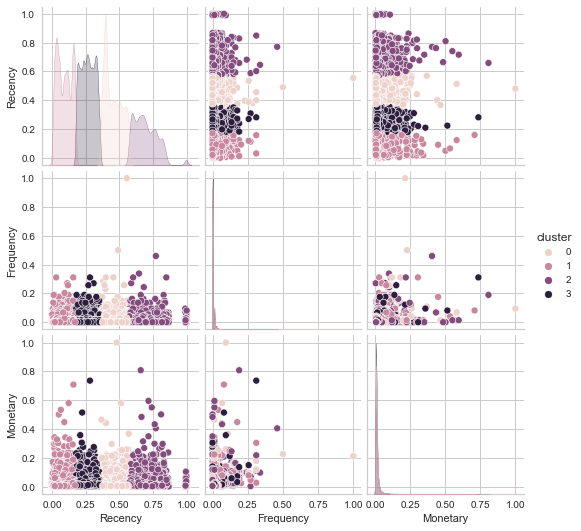

In [24]:
sns.pairplot(rfm_kmeans_scaled_4, hue="cluster")

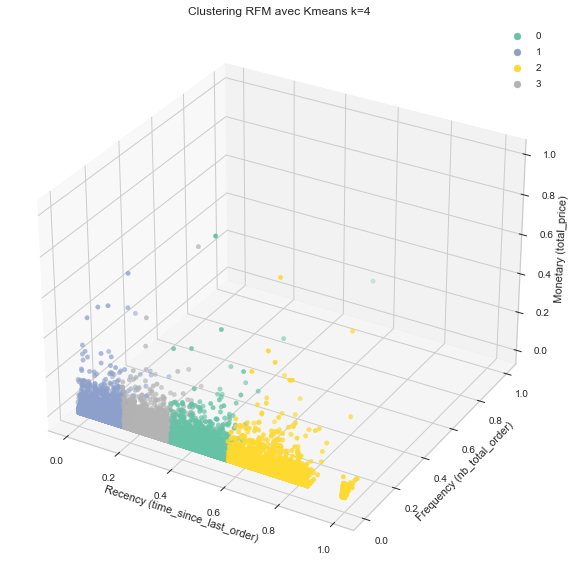

In [20]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(rfm_kmeans_scaled_4.iloc[:, 0],
                     rfm_kmeans_scaled_4.iloc[:, 1],
                     rfm_kmeans_scaled_4.iloc[:, 2],
                     c=rfm_lab_4, cmap=plt.cm.Set2)

ax.legend(*scatter.legend_elements())
ax.set_xlabel('Recency (time_since_last_order)')
ax.set_ylabel('Frequency (nb_total_order)')
ax.set_zlabel('Monetary (total_price)')
ax.set_title('Clustering RFM avec Kmeans k=4')

plt.show()

La représentation 3D nous permet de voir que la séparation des clusters se fait en grande partie au niveau de l'axe de la recense.

In [21]:
rfm_kmeans_4 = rfm.copy()
rfm_kmeans_4['cluster'] = rfm_lab_4

In [22]:
radar_cluster(rfm_kmeans_4, 'cluster', strat='mean')

Le modèle kmeans avec k = 4 permet d'obtenir les 4 clusters suivants :
- cluster 1 : les clients ayant commandé il y a assez longtemps, fréquemment et pour un montant élevé.
- cluster 2 : les clients ayant commandé récemment pour un montant très élevé.
- cluster 3 : les clients ayant commandé il y a longtemps et pour un montant très élevé.
- cluster 4 : les clients ayant commandé il y a longtemps, assez fréquemment mais pour un montant faible. 

In [23]:
print('Modèle kmeans k=4')
print('Silhouette Score : ', silhouette_score(rfm_scaled, rfm_lab_4))
print('Davies Bouldin Score : ', davies_bouldin_score(rfm_scaled, rfm_lab_4))
print('Calinski Harabasz Score :', calinski_harabasz_score(rfm_scaled,
                                                           rfm_lab_4))

Modèle kmeans k=4
Silhouette Score :  0.5336532966419448
Davies Bouldin Score :  0.5502103932434423
Calinski Harabasz Score : 328732.63378289214


**Modèle kmeans avec k = 5**

In [ ]:
mod_rfm_final_5 = KMeans(n_clusters=5, random_state=0)
mod_rfm_final_5.fit(rfm_scaled)

In [ ]:
rfm_lab_5 = mod_rfm_final_5.predict(rfm_scaled)

In [ ]:
rfm_kmeans_scaled_5 = rfm_scaled.copy()
rfm_kmeans_scaled_5['cluster'] = rfm_lab_5

In [ ]:
sns.pairplot(rfm_kmeans_scaled_5, hue="cluster")

In [ ]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(rfm_kmeans_scaled_5.iloc[:, 0],
                     rfm_kmeans_scaled_5.iloc[:, 1],
                     rfm_kmeans_scaled_5.iloc[:, 2],
                     c=rfm_lab_5, cmap=plt.cm.Set2)

ax.legend(*scatter.legend_elements())
ax.set_xlabel('Recency (time_since_last_order)')
ax.set_ylabel('Frequency (nb_total_order)')
ax.set_zlabel('Monetary (total_price)')
ax.set_title('Clustering RFM avec Kmeans k=5')

plt.show()

In [ ]:
rfm_kmeans_5 = rfm.copy()
rfm_kmeans_5['cluster'] = rfm_lab_5

In [ ]:
radar_cluster(rfm_kmeans_5, 'cluster', strat='mean')

Le modèle kmeans avec k = 5 permet d'obtenir les 5 clusters suivants :
- cluster 1 : les clients ayant commandé il n'y a pas très longtemps, assez fréquemment et pour un faible montant.
- cluster 2 : les clients ayant commandé récemment et pour un montant de panier moyennement élevé. 
- cluster 3 : les clients ayant commandé il y a longtemps, assez fréquemment et pour un montant de panier élevé.
- cluster 4 : les clients ayant commandé il y a assez longtemps, fréquemment et pour un montant assez faible.
- cluster 5 : les clients ayant commandé il y a peu de temps, assez fréquemment et pour un montant assez faible.

In [545]:
print('Modèle kmeans k=5')
print('Silhouette Score : ', silhouette_score(rfm_scaled, rfm_lab_5))
print('Davies Bouldin Score : ', davies_bouldin_score(rfm_scaled, rfm_lab_5))
print('Calinski Harabasz Score :', calinski_harabasz_score(rfm_scaled,
                                                           rfm_lab_5))

Modèle kmeans k=5
Silhouette Score :  0.5285496943415656
Davies Bouldin Score :  0.5524914216130343
Calinski Harabasz Score : 378307.4899309915


De manière générale, les différents clustering réalisés par le kmeans sur le dataframe RFM (k = 2, 4 et 5) obtiennent de bons scores de silhouette, Davies Bouldin et Calinski Harabasz.

In [495]:
# Export du modèle
with open('models/kmeans_rfm_final_k4', 'wb') as f1:
    pickle.dump(mod_rfm_final_4, f1)

Nous allons désormais appliquer un nouveau modèle à la segmentation RFM: le DBSCAN.

## <a id="9"></a> 2.3 DBSCAN

L'algorithme DBSCAN (Density-Based Spatial Clustering of Applications with Noise) itère sur les points du jeu de données. Pour chacun des points qu'il analyse, il construit l'ensemble des points atteignables par densité depuis ce point : il calcule l'epsilon-voisinage de ce point, puis, si ce voisinage contient plus de *min_samples* points, les epsilon-voisinages de chacun d'entre eux, et ainsi de suite, jusqu'à ne plus pouvoir agrandir le cluster. Si le point considéré n'est pas un point intérieur, c'est-à-dire qu'il n'a pas suffisamment de voisins, il sera alors étiqueté comme du bruit. Cela permet à DBSCAN d'être robuste aux données aberrantes puisque ce mécanisme les isole.

Les deux paramètres *'eps'* et *'min_samples'* permettent de fixer les paramètres de l’algorithme à savoir la distance ε et le nombre minimal de voisins.

La valeur de *'min_samples'* peut être déterminée grâce à une expertise métier. Ici, nous utiliserons la méthode alternative qui consiste à déterminer la valeur du paramètre comme étant égal à 2 * nombre de dimensions. Donc ici 
*min_samples*=6.

Une méthode pour optimiser le ε consiste à regarder pour chaque observation à quelle distance se situe son voisin le plus proche. Ensuite il suffit de fixer un ε tel qu’une part d'environ 90-95% des observations aient une distance à son plus proche voisin inférieure à ε.

La classe *NearestNeighbors* qui permet de déterminer les voisins les plus proches de chaque observation ainsi que les distances.


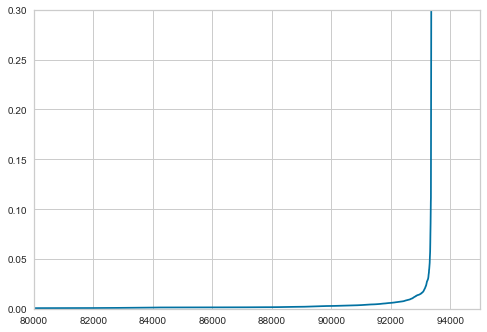

In [361]:
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(rfm_scaled)
distances, indices = nbrs.kneighbors(rfm_scaled)
distances = np.sort(distances, axis=0)
dist = distances[:, 1]
plt.xlim(80000, 95000)
plt.ylim(0, 0.3)
plt.plot(dist)

In [362]:
kneedle = KneeLocator(x=range(1, len(distances)+1), y=dist, S=10,
                      curve="convex", direction="increasing", online=True)

# get the estimate of knee point
print(kneedle.knee_y)

0.0008348742293969487


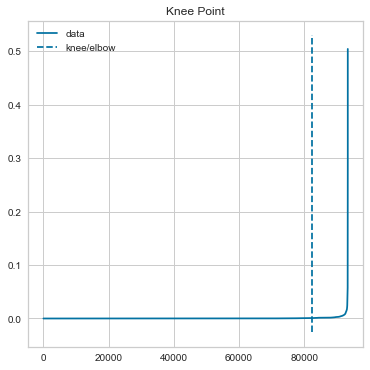

In [363]:
kneedle.plot_knee()
plt.show()

In [364]:
db_rfm = DBSCAN(eps=0.0008, min_samples=6, n_jobs=-1)

db_rfm.fit(rfm_scaled)

DBSCAN(eps=0.0008, min_samples=6, n_jobs=-1)

In [365]:
db_lab = db_rfm.labels_

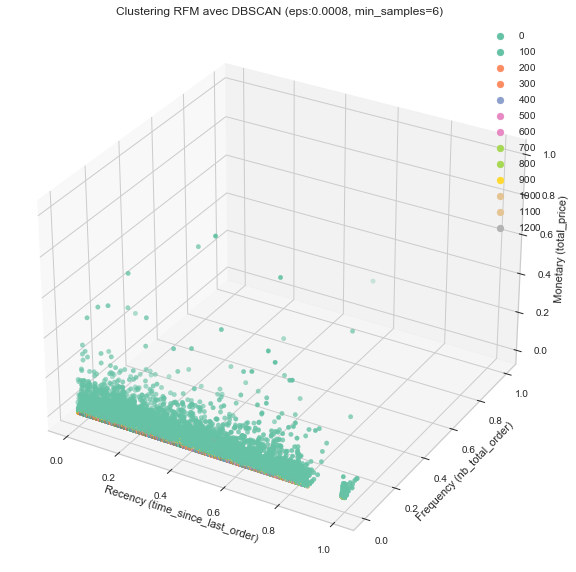

In [366]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(rfm_scaled.iloc[:, 0],
                     rfm_scaled.iloc[:, 1],
                     rfm_scaled.iloc[:, 2],
                     c=db_lab, cmap=plt.cm.Set2)

ax.legend(*scatter.legend_elements())
ax.set_xlabel('Recency (time_since_last_order)')
ax.set_ylabel('Frequency (nb_total_order)')
ax.set_zlabel('Monetary (total_price)')
ax.set_title('Clustering RFM avec DBSCAN (eps:0.0008, min_samples=6)')

plt.show()

In [367]:
print('Nombre de clusters avec le modèle DBSCAN: ',
      len(set(db_lab)) - (1 if -1 in db_lab else 0))
print('Nombre de points considérés comme du bruit: ', list(db_lab).count(-1))
print('Silhouette Score : ', silhouette_score(rfm_scaled, db_lab))
print('Davies Bouldin Score : ', davies_bouldin_score(rfm_scaled, db_lab))
print('Calinski Harabasz Score : ', calinski_harabasz_score(rfm_scaled,
                                                            db_lab))

Nombre de clusters avec le modèle DBSCAN:  1292
Nombre de points considérés comme du bruit:  24679
Silhouette Score :  -0.22086824204230085
Davies Bouldin Score :  2.759430738553151
Calinski Harabasz Score :  155.78560631040565


Essayons plusieurs valeurs d'epsilon.

In [368]:
for e in [0.01, 0.02, 0.03, 0.04, 0.05, 0.07, 0.1]:
    db_rfm_es = DBSCAN(eps=e, min_samples=6, n_jobs=-1)
    db_rfm_es.fit(rfm_scaled)
    db_lab_es = db_rfm_es.labels_

    print('Paramètres du modèle : epsilon : {}, min_samples : 6'.format(e))
    print('Nombre de clusters avec le modèle DBSCAN : ',
          len(set(db_lab_es)) - (1 if -1 in db_lab_es else 0))
    print('Nombre de points considérés comme du bruit: ',
          list(db_lab_es).count(-1))
    print('Silhouette Score : ', silhouette_score(rfm_scaled, db_lab_es))
    print('Davies Bouldin Score : ', davies_bouldin_score(rfm_scaled,
                                                          db_lab_es))
    print('Calinski Harabasz Score : ', calinski_harabasz_score(rfm_scaled,
                                                                db_lab_es))
    print('-----'*10)

Paramètres du modèle : epsilon : 0.01, min_samples : 6
Nombre de clusters avec le modèle DBSCAN :  60
Nombre de points considérés comme du bruit:  1669
Silhouette Score :  -0.775609440086861
Davies Bouldin Score :  3.061004030826042
Calinski Harabasz Score :  63.82571815845833
--------------------------------------------------
Paramètres du modèle : epsilon : 0.02, min_samples : 6
Nombre de clusters avec le modèle DBSCAN :  6
Nombre de points considérés comme du bruit:  386
Silhouette Score :  -0.2565238639525437
Davies Bouldin Score :  1.791595537274055
Calinski Harabasz Score :  419.4367159060227
--------------------------------------------------
Paramètres du modèle : epsilon : 0.03, min_samples : 6
Nombre de clusters avec le modèle DBSCAN :  4
Nombre de points considérés comme du bruit:  217
Silhouette Score :  -0.17824029183999743
Davies Bouldin Score :  1.5521972301136293
Calinski Harabasz Score :  623.1058652413222
--------------------------------------------------
Paramètres du

On constate que les meilleurs scores obtenus sont dans l'ensemble avec le modèle ayant un *epsilon* à 0.1 et un *min_samples* à 6.

Après avoir obtenu les résultats des différents scores pour différentes valeurs d'epsilon, nous continuerons l'étude en analysant les modèles créant 2,3 et 4 clusters. 

**Modèle DBSCAN avec epsilon = 0.1 et min_samples = 6**

In [371]:
db_rfm_01 = DBSCAN(eps=0.1, min_samples=6, n_jobs=-1)

db_rfm_01.fit(rfm_scaled)

DBSCAN(eps=0.1, min_samples=6, n_jobs=-1)

In [372]:
db_lab_01 = db_rfm_01.labels_

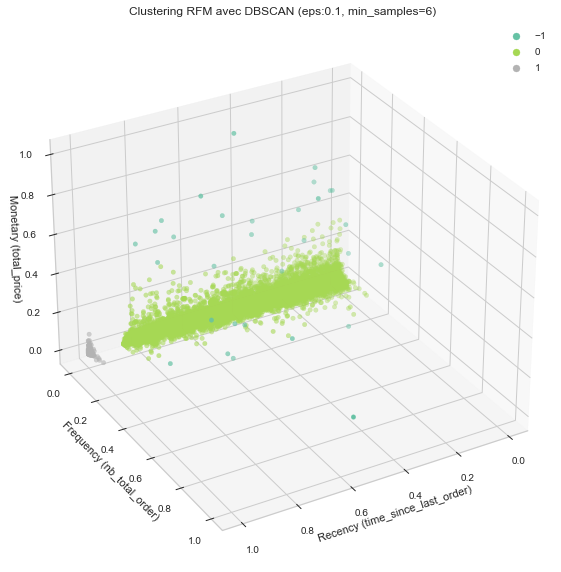

In [377]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d', azim=60, elev=30)
scatter = ax.scatter(rfm_scaled.iloc[:, 0],
                     rfm_scaled.iloc[:, 1],
                     rfm_scaled.iloc[:, 2],
                     c=db_lab_01,
                     cmap=plt.cm.Set2)

ax.legend(*scatter.legend_elements())
ax.set_xlabel('Recency (time_since_last_order)')
ax.set_ylabel('Frequency (nb_total_order)')
ax.set_zlabel('Monetary (total_price)')
ax.set_title('Clustering RFM avec DBSCAN (eps:0.1, min_samples=6)')

plt.show()

In [383]:
rfm_db_01 = rfm.copy()
rfm_db_01['cluster'] = db_lab_01
rfm_db_01 = rfm_db_01[rfm_db_01['cluster'] != -1]

In [384]:
rfm_db_01.groupby('cluster').mean()

,Recency,Frequency,Monetary
cluster,,,
0,235.681057,1.234945,146.796340
1,690.956522,1.280632,161.835494


In [385]:
radar_cluster(rfm_db_01, 'cluster', strat='mean')

On constate que le modèle créé 2 clusters: l'un avec des valeurs élevées pour les 3 variables (soit des clients ayant acheté il y a quelques temps,fréquemment et pour un montant élevé) et l'autre, à l'inverse, comporte les clients ayant acheté récemment pour un plus petit montant.
Il y a également 31 points considérés comme du bruit.

In [378]:
print('Paramètres du modèle : epsilon : 0.1, min_samples : 6.')
print('Nombre de clusters avec le modèle DBSCAN : ',
      len(set(db_lab_01)) - (1 if -1 in db_lab_01 else 0))
print('Nombre de points considérés comme du bruit: ',
      list(db_lab_01).count(-1))
print('Silhouette Score : ', silhouette_score(rfm_scaled, db_lab_01))
print('Davies Bouldin Score : ', davies_bouldin_score(rfm_scaled, db_lab_01))
print('Calinski Harabasz Score : ', calinski_harabasz_score(rfm_scaled,
                                                            db_lab_01))

Paramètres du modèle : epsilon : 0.1, min_samples : 6.
Nombre de clusters avec le modèle DBSCAN :  2
Nombre de points considérés comme du bruit:  31
Silhouette Score :  0.4876415604531913
Davies Bouldin Score :  1.0054772953103024
Calinski Harabasz Score :  1207.8292213149625


**Modèle DBSCAN avec epsilon = 0.04 et min_samples = 6**

In [386]:
db_rfm_04 = DBSCAN(eps=0.04, min_samples=6, n_jobs=-1)
db_rfm_04.fit(rfm_scaled)
db_lab_04 = db_rfm_04.labels_

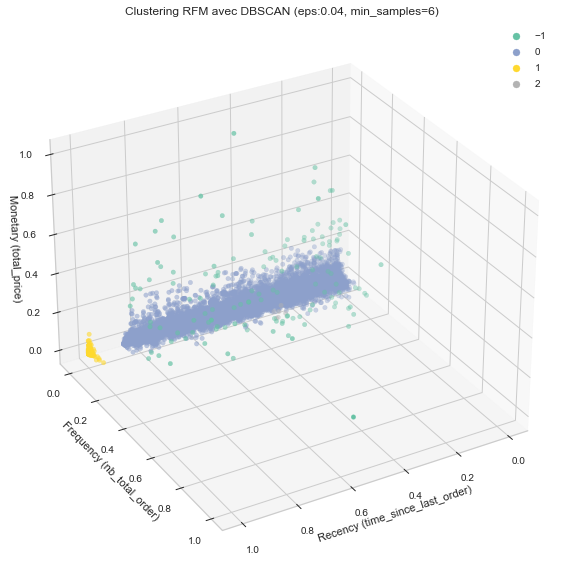

In [387]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d', azim=60, elev=30)
scatter = ax.scatter(rfm_scaled.iloc[:, 0],
                     rfm_scaled.iloc[:, 1],
                     rfm_scaled.iloc[:, 2],
                     c=db_lab_04,
                     cmap=plt.cm.Set2)

ax.legend(*scatter.legend_elements())
ax.set_xlabel('Recency (time_since_last_order)')
ax.set_ylabel('Frequency (nb_total_order)')
ax.set_zlabel('Monetary (total_price)')
ax.set_title('Clustering RFM avec DBSCAN (eps:0.04, min_samples=6)')

plt.show()

In [391]:
rfm_db_04 = rfm.copy()
rfm_db_04['cluster'] = db_lab_04
rfm_db_04 = rfm_db_04[rfm_db_04['cluster'] != -1]

In [390]:
rfm_db_04.groupby('cluster').mean()

,Recency,Frequency,Monetary
cluster,,,
-1,270.870229,10.007634,3017.222901
0,235.653372,1.226381,144.517132
1,690.956522,1.280632,161.835494
2,235.666667,12.000000,801.990000


In [395]:
rfm_scaled_db_04 = rfm_scaled.copy()
rfm_scaled_db_04['cluster'] = db_lab_04

In [392]:
radar_cluster(rfm_db_04, 'cluster', strat='mean')

In [393]:
print('Paramètres du modèle : epsilon : 0.04, min_samples : 6.')
print('Nombre de clusters avec le modèle DBSCAN : ',
      len(set(db_lab_04)) - (1 if -1 in db_lab_04 else 0))
print('Nombre de points considérés comme du bruit: ',
      list(db_lab_04).count(-1))
print('Silhouette Score : ', silhouette_score(rfm_scaled, db_lab_04))
print('Davies Bouldin Score : ', davies_bouldin_score(rfm_scaled, db_lab_04))
print('Calinski Harabasz Score : ', calinski_harabasz_score(rfm_scaled,
                                                            db_lab_04))

Paramètres du modèle : epsilon : 0.04, min_samples : 6.
Nombre de clusters avec le modèle DBSCAN :  3
Nombre de points considérés comme du bruit:  131
Silhouette Score :  -0.0499551510803133
Davies Bouldin Score :  1.6064371395065011
Calinski Harabasz Score :  819.2254768624456


Le modèle obtient cette fois-ci 3 clusters :
- cluster 1 : le client a acheté récemment et pour un petit montant.
- cluster 2 : le client a acheté il y a longtemps et pour un petit montant.
- cluster 3 : le client a acheté récemment, fréquemment et pour de hauts montants.

Il y a 131 points considéré comme du bruit. De plus, les différents scores ne sont pas très bons. 

**Modèle DBSCAN avec epsilon = 0.03 et min_samples = 6**

In [58]:
db_rfm_03 = DBSCAN(eps=0.03, min_samples=6, n_jobs=-1)
db_rfm_03.fit(rfm_scaled)
db_lab_03 = db_rfm_03.labels_

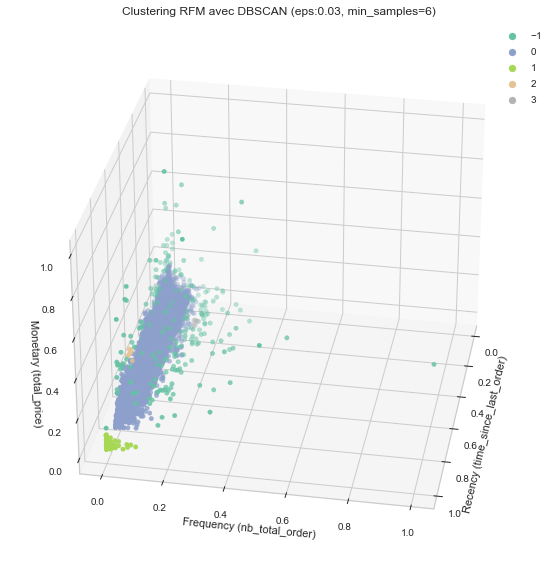

In [59]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d', azim=10, elev=30)
scatter = ax.scatter(rfm_scaled.iloc[:, 0],
                     rfm_scaled.iloc[:, 1],
                     rfm_scaled.iloc[:, 2],
                     c=db_lab_03,
                     cmap=plt.cm.Set2)

ax.legend(*scatter.legend_elements())
ax.set_xlabel('Recency (time_since_last_order)')
ax.set_ylabel('Frequency (nb_total_order)')
ax.set_zlabel('Monetary (total_price)')
ax.set_title('Clustering RFM avec DBSCAN (eps:0.03, min_samples=6)')

plt.show()

In [404]:
rfm_db_03 = rfm.copy()
rfm_db_03['cluster'] = db_lab_03
rfm_db_03 = rfm_db_03[rfm_db_03['cluster'] != -1]

In [403]:
rfm_db_03.groupby('cluster').mean()

,Recency,Frequency,Monetary
cluster,,,
-1,273.534562,9.004608,2402.338525
0,235.604996,1.220759,143.096662
1,690.960317,1.281746,156.926111
2,447.000000,1.125000,2666.583750
3,165.600000,11.200000,809.750000


In [405]:
radar_cluster(rfm_db_03, 'cluster', strat='mean')

In [406]:
print('Paramètres du modèle : epsilon : 0.03, min_samples : 6.')
print('Nombre de clusters avec le modèle DBSCAN : ',
      len(set(db_lab_03)) - (1 if -1 in db_lab_03 else 0))
print('Nombre de points considérés comme du bruit: ',
      list(db_lab_03).count(-1))
print('Silhouette Score : ', silhouette_score(rfm_scaled, db_lab_03))
print('Davies Bouldin Score : ', davies_bouldin_score(rfm_scaled, db_lab_03))
print('Calinski Harabasz Score : ', calinski_harabasz_score(rfm_scaled,
                                                            db_lab_03))

Paramètres du modèle : epsilon : 0.03, min_samples : 6.
Nombre de clusters avec le modèle DBSCAN :  4
Nombre de points considérés comme du bruit:  217
Silhouette Score :  -0.17824029183999743
Davies Bouldin Score :  1.5521972301136293
Calinski Harabasz Score :  623.1058652413222


Nous avons ici 4 clusters ainsi que 217 points considérész comme du bruit. Encore une fois, les différents scores représentés sont mauvais. Les clusters sont : 
- cluster 1 : les clients ont acheté il n'y a pas très longtemps pour un montant faible.
- cluster 2 : les clients ont acheté il y a longtemps pour un montant faible.
- cluster 3 : les clients ont acheté il y a relativement longtemps pour un montant élevé.
- cluster 4 : les clients ont acheté fréquemment pour un montant moyennement élevé.

L'étude de la modélisation avec DBSCAN n'est pas concluante. En effet, les clusters identifiés ne sont pas nécessairement meilleurs que ceux du kmeans d'un point de vue interprétation métier. De plus, les scores de ces modèles sont mauvais, ils indiquent que les clusters sont mal séparés, ils sont proches et dispersés. Certains points sont également considérés comme du bruit et ne sont donc pas inclus dans les clusters.

Nous décidons donc de ne pas utiliser ce modèle par la suite. 

Nous allons désormais appliquer un nouveau modèle à la segmentation RFM : le Clustering hierarchique.

## <a id="10"></a> 2.4 Classification Ascendante hierarchique (CAH)

Le principe de la CAH est de rassembler des individus selon un critère de ressemblance défini au préalable qui s’exprimera sous la forme d’une matrice de distances, exprimant la distance existant entre chaque individu pris deux à deux. Deux observations identiques auront une distance nulle. La CAH va ensuite rassembler les individus de manière itérative afin de produire un dendrogramme. La classification est ascendante car elle part des observations individuelles ; elle est hiérarchique car elle produit des classes ou groupes de plus en plus vastes, incluant des sous-groupes en leur sein. 

La classification hierarchique n'est pas adapté à un jeu de données trop volumineux. C'est pourquoi dans un premier temps, nous allons réduire notre data set afin de pouvoir réaliser une modélisation avec ce modèle. Nous allons donc vérifier l'ARI (adjusted rand score) entre le jeu de données total et différents échantillons, et ce avec le modèle Kmeans précédemment étudié. Nous pourrons ainsi déterminer quelle taille d'échantillon est suffisamment similaire au data set entier afin de l'utiliser pour notre modélisation de classification hierarchique.

In [496]:
kmeans_global = mod_rfm_final_4

In [504]:
ARI = []
for s in [5000, 10000, 30000, 50000, 70000, 90000]:
    X = rfm.sample(n=s, random_state=0).copy()
    X_scaled = pd.DataFrame(preprocessor.fit_transform(X),
                            index=X.index,
                            columns=X.columns)

    kmeans_sample = KMeans(4, random_state=0)
    kmeans_sample.fit(X_scaled)
    kmeans_sample_lab = kmeans_sample.predict(X_scaled)

    kmeans_lab = kmeans_global.predict(X_scaled)

    ARI_score = adjusted_rand_score(kmeans_lab, kmeans_sample_lab)
    ARI.append([s, ARI_score])

print('Voici les scores ARI pour chaque sample :')
display(pd.DataFrame(ARI, columns=['Échantillons', 'ARI']))

Voici les scores ARI pour chaque sample :


,Échantillons,ARI
0,5000,0.954269
1,10000,0.988204
2,30000,0.977649
3,50000,0.991371
4,70000,0.997251
5,90000,0.992897


Nous sélectionnons donc 50 000 observations. Valeur qui nous permet de réduire notre data set tout en gardant un score ARI très élevé.

In [505]:
X_reduced = rfm.sample(n=50000, random_state=0).copy()

In [506]:
col_quanti = X_reduced.select_dtypes(['int64', 'float64']).columns
col_quali = X_reduced.select_dtypes(['category', 'object', 'bool']).columns

minmax_scale = MinMaxScaler()
ohe = OneHotEncoder()

preprocessor = ColumnTransformer(transformers=[
    ('quanti', minmax_scale, col_quanti),
    ('quali', ohe, col_quali)
])

In [507]:
X_red_scaled = pd.DataFrame(preprocessor.fit_transform(X_reduced),
                            index=X_reduced.index,
                            columns=X_reduced.columns)

In [508]:
Z = linkage(X_red_scaled, method="ward")

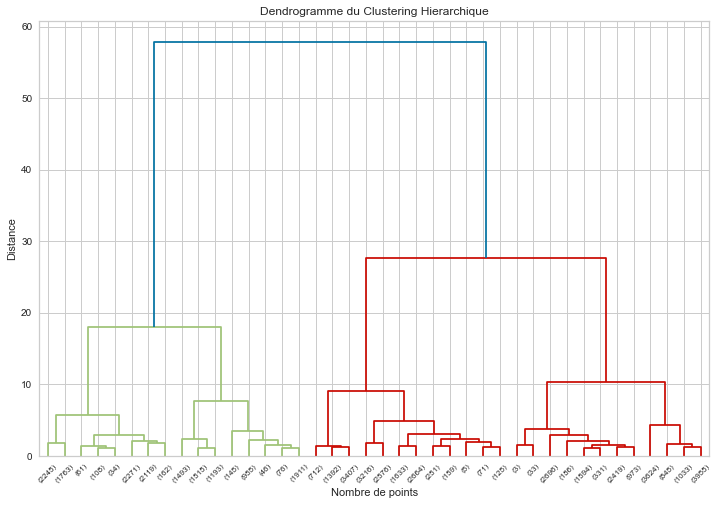

In [509]:
fig, ax = plt.subplots(1, 1, figsize=(12, 8))

_ = dendrogram(Z, p=40, truncate_mode="lastp", ax=ax)

plt.title("Dendrogramme du Clustering Hierarchique")
plt.xlabel("Nombre de points")
plt.ylabel("Distance")
plt.show()

Le dendrogramme nous permet d'observer que 2, 3 ou 4 clusters semblent être des séparations idéales.

Nous allons désormais déterminer les silhouettes scores et labels associés à différents nombres de clusters avec AgglomerativeClustering.

In [510]:
k_sil_lab = []
mod_cah = []

for k in range(2, 9):
    cah = AgglomerativeClustering(n_clusters=k)
    cah.fit(X_red_scaled)

    cah_lab = cah.labels_
    score = silhouette_score(X_red_scaled, cah_lab)

    k_sil_lab.append([k, score, cah_lab])
    mod_cah.append([k, cah])
    print('Boucle k = {} terminée'.format(k))

display(k_sil_lab)

Boucle k = 2 terminée
Boucle k = 3 terminée
Boucle k = 4 terminée
Boucle k = 5 terminée
Boucle k = 6 terminée
Boucle k = 7 terminée
Boucle k = 8 terminée


[[2, 0.5836469986245769, array([0, 1, 0, ..., 1, 0, 0])],
 [3, 0.5254445608364084, array([2, 0, 2, ..., 0, 1, 1])],
 [4, 0.5118661755150412, array([2, 3, 2, ..., 3, 0, 0])],
 [5, 0.46191888660138647, array([0, 3, 0, ..., 3, 2, 2])],
 [6, 0.4535040735794884, array([3, 1, 3, ..., 1, 2, 2])],
 [7, 0.43606036112149343, array([1, 0, 1, ..., 0, 2, 2])],
 [8, 0.4322505721069574, array([0, 4, 0, ..., 4, 2, 2])]]

On constate bien que pour les valeurs de *n_clusters* allant de 2 à 4, les silhouette score sont meilleurs. Nous observerons donc les caractéristiques des clusters pour ces différentes segmentations.

In [526]:
print('Paramètres du modèle CAH: k=2.')
print('Silhouette Score : ', silhouette_score(X_red_scaled, k_sil_lab[0][2]))
print('Davies Bouldin Score : ', davies_bouldin_score(X_red_scaled,
                                                      k_sil_lab[0][2]))
print('Calinski Harabasz Score : ', calinski_harabasz_score(X_red_scaled,
                                                            k_sil_lab[0][2]))

Paramètres du modèle CAH: k=2.
Silhouette Score :  0.5836469986245769
Davies Bouldin Score :  0.5501983100929154
Calinski Harabasz Score :  105043.33081484096


In [527]:
X_red_cah_k2 = X_reduced.copy()
X_red_cah_k2['cluster'] = k_sil_lab[0][2]

In [528]:
radar_cluster(X_red_cah_k2, 'cluster', strat='mean')

Avec le modèle CAH avec k = 2, nous obtenons les clusters suivants :
- cluster 1 : les clients ont commandé récemment et pour un montant faible.
- cluster 2 : les clients ont commandé il y a longtemps, fréquemment et pour un montant élevé.

In [529]:
print('Paramètres du modèle CAH: k=3.')
print('Silhouette Score : ', silhouette_score(X_red_scaled, k_sil_lab[1][2]))
print('Davies Bouldin Score : ', davies_bouldin_score(X_red_scaled,
                                                      k_sil_lab[1][2]))
print('Calinski Harabasz Score : ', calinski_harabasz_score(X_red_scaled,
                                                            k_sil_lab[1][2]))

Paramètres du modèle CAH: k=3.
Silhouette Score :  0.5254445608364084
Davies Bouldin Score :  0.5698238844178025
Calinski Harabasz Score :  124059.79588981035


In [530]:
X_red_cah_k3 = X_reduced.copy()
X_red_cah_k3['cluster'] = k_sil_lab[1][2]

In [531]:
radar_cluster(X_red_cah_k3, 'cluster', strat='mean')

Avec le modèle CAH avec k = 3, nous obtenons les clusters suivants :
- cluster 1 : les clients ont commandé il y a longtemps, fréquemment et pour un montant élevé.
- cluster 2 : les clients ont commandé assez récemment et fréquemment, pour un montant faible.
- cluster 3 : les clients ont commandé récemment pour un montant élevé.

In [532]:
print('Paramètres du modèle CAH: k=4.')
print('Silhouette Score : ', silhouette_score(X_red_scaled, k_sil_lab[2][2]))
print('Davies Bouldin Score : ', davies_bouldin_score(X_red_scaled,
                                                      k_sil_lab[2][2]))
print('Calinski Harabasz Score : ', calinski_harabasz_score(X_red_scaled,
                                                            k_sil_lab[2][2]))

Paramètres du modèle CAH: k=4.
Silhouette Score :  0.5118661755150412
Davies Bouldin Score :  0.5825808492069495
Calinski Harabasz Score :  147138.55790322978


In [533]:
X_red_cah_k4 = X_reduced.copy()
X_red_cah_k4['cluster'] = k_sil_lab[2][2]

In [534]:
radar_cluster(X_red_cah_k4, 'cluster', strat='mean')

Avec le modèle CAH avec k = 4, nous obtenons les clusters suivants :
- cluster 1 : les clients ont commandé assez récemment et fréquemment, pour un montant faible.
- cluster 2 : les clients ont commandé il y a longtemps, pour un montant assez élevé.
- cluster 3 : les clients ont commandé récemment pour un montant élevé.
- cluster 4 : les clients ont commandé il y a assez longtemps, fréquemment et pour un montant très élevé.

Les clusters identifiés à l'aide de la classification ascendante hierarchique ne sont pas nécessairement plus interprétables d'un point de vue métier que ceux obtenus à l'aide du kmeans. L'agorithme kmeans offre également de meilleures métriques.
De plus, la modélisation est bien plus coûteuse en temps de calculs et réalisable seulement sur un échantillon du data set. 

C'est pour ces raisons que nous continuerons notre étude sans ce modèle.

# <a id="11"></a> 3. Segmentation RFM + score

In [170]:
rfm_score = data[['customer_unique_id', 'time_since_last_order',
                  'nb_total_order', 'total_price',
                  'mean_review_score']].copy()

In [171]:
rfm_score = rfm_score.set_index('customer_unique_id')
rfm_score.columns = ['Recency', 'Frequency', 'Monetary', 'Score']

In [172]:
rfm_score.head()

,Recency,Frequency,Monetary,Score
customer_unique_id,,,,
0000366f3b9a7992bf8c76cfdf3221e2,111,1,129.90,5.0
0000b849f77a49e4a4ce2b2a4ca5be3f,114,1,18.90,4.0
0000f46a3911fa3c0805444483337064,536,1,69.00,3.0
0000f6ccb0745a6a4b88665a16c9f078,320,1,25.99,4.0
0004aac84e0df4da2b147fca70cf8255,287,1,180.00,5.0


In [173]:
col_quanti = rfm_score.select_dtypes(['int64', 'float64']).columns
col_quali = rfm_score.select_dtypes(['category', 'object', 'bool']).columns

minmax_scale = MinMaxScaler()
ohe = OneHotEncoder()

preprocessor = ColumnTransformer(transformers=[
    ('quanti', minmax_scale, col_quanti),
    ('quali', ohe, col_quali)
])

In [174]:
rfm_score_scaled = pd.DataFrame(preprocessor.fit_transform(rfm_score),
                                index=rfm_score.index,
                                columns=rfm_score.columns)
rfm_score_scaled.head()

,Recency,Frequency,Monetary,Score
customer_unique_id,,,,
0000366f3b9a7992bf8c76cfdf3221e2,0.159942,0.0,0.009603,1.00
0000b849f77a49e4a4ce2b2a4ca5be3f,0.164265,0.0,0.001343,0.75
0000f46a3911fa3c0805444483337064,0.772334,0.0,0.005071,0.50
0000f6ccb0745a6a4b88665a16c9f078,0.461095,0.0,0.001871,0.75
0004aac84e0df4da2b147fca70cf8255,0.413545,0.0,0.013330,1.00


De la même manière que pour le précédent dataframe, nous modélisons nos clusters à l'aide d'un kmeans.

## <a id="12"></a> 3.1 KElbowVisualizer

Nous déterminons le nombre de cluster optimal avec la méthode du coude, puis nous observerons les différents clusters trouvés à l'aide d'un silhouette visualizer.

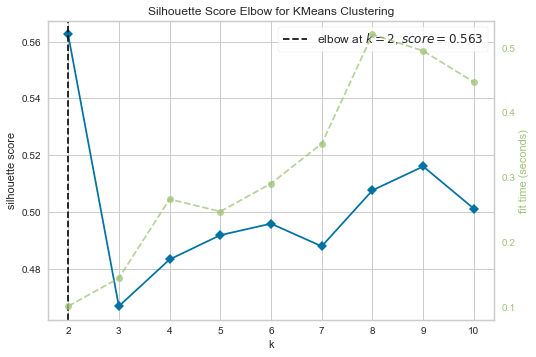

In [175]:
vis = elbow_visualizer(2, 11, rfm_score_scaled, 'silhouette')

In [176]:
recap_kmeans_rfm_score = pd.DataFrame(data={'k': np.arange(2, 11),
                                            'sil_scores': vis.k_scores_,
                                            'temps': vis.k_timers_})

In [177]:
recap_kmeans_rfm_score

,k,sil_scores,temps
0,2,0.562538,0.100608
1,3,0.466765,0.144037
2,4,0.483233,0.266131
3,5,0.491806,0.246974
4,6,0.495848,0.290299
5,7,0.487881,0.351980
6,8,0.507611,0.520811
7,9,0.516005,0.495313
8,10,0.501117,0.446929


In [178]:
k_select = vis.elbow_value_

In [179]:
k_select

2

La méthode du coude basé sur le score de silhouette nous indique que la segmentation en 2 clusters (k=2) semble la plus optimale.

## <a id="13"></a> 3.2 Silhouette Visualizer

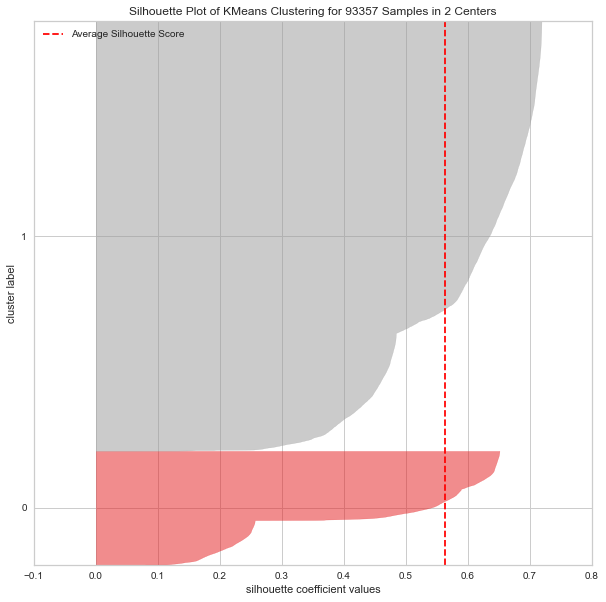

In [180]:
silhouette_visualizer(k_select, rfm_score_scaled)

On constate ici que le cluster 1 est très large contrairement au 0. Cela se produit parce que la largeur de chaque silhouette est proportionnelle au nombre d'échantillons affectés au cluster. Il y a donc énormément d'échantillons affectés à ce cluster. À l'inverse, le cluster 0 en comporte moins.

Les silhouettes score sont positifs, ce qui signifie qu'aucune erreur n'a été effectuée. Le silhouette score moyen se situe au-dessus de 0.55.

Nous observons ensuite le k optimal trouvé par le elbow visualizer avec d'autres métriques afin de le comparer avec celui trouvé précédemment. 

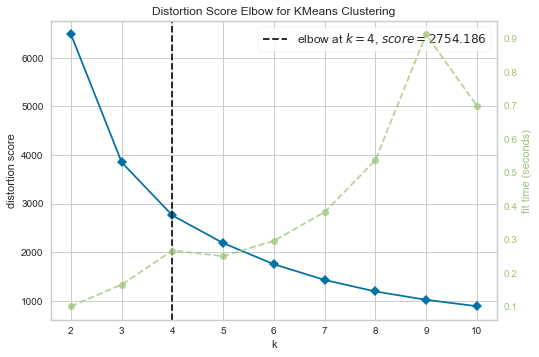

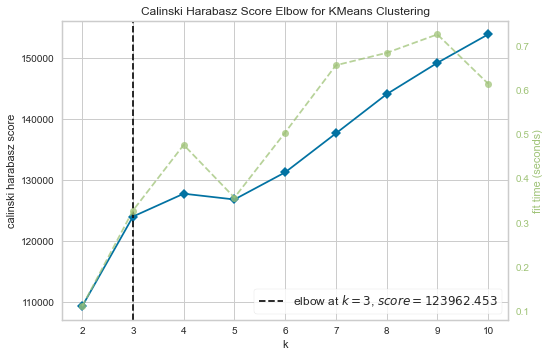

In [181]:
metrics = ["distortion", "calinski_harabasz"]

for m in metrics:
    elbow_visualizer(2, 11, rfm_score_scaled, m)

La méthode du coude avec le score de distortion nous indique un k optimal de 4. Avec la métrique 'calinski_harabasz', le choix se porte plutôt sur k = 3.

Nous allons désormais également étudier le graphique silhouette pour ces différents clustering.

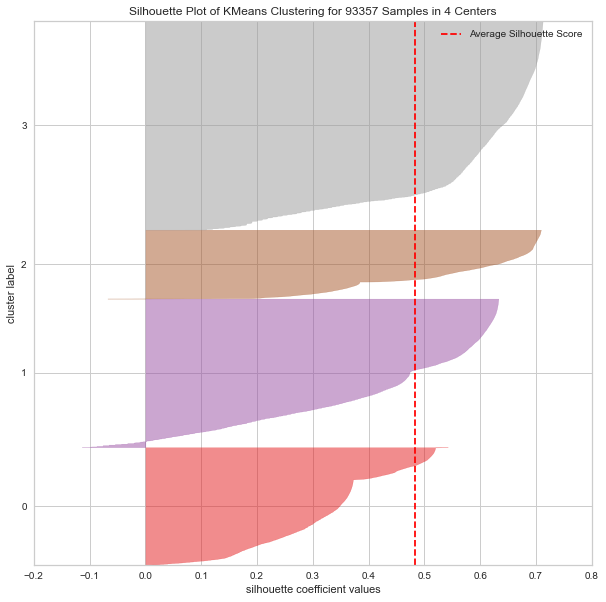

In [182]:
silhouette_visualizer(4, rfm_score_scaled)

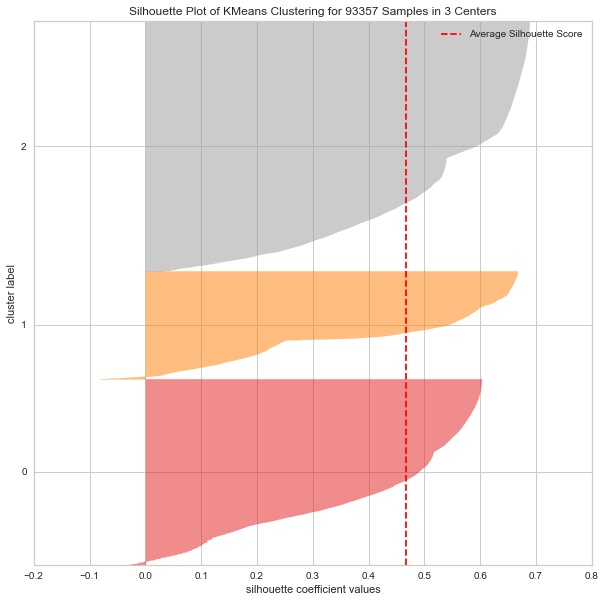

In [184]:
silhouette_visualizer(3, rfm_score_scaled)

Pour k = 4, les différents clusters sont mal repartis et hétérogènes. En effet, le clusters 3 est très large tandis que le 2 est beaucoup plus fin. On constate également des observations qui semblent avoir un silhouette score négatif dans les clusters 1 et 2. Ces dernières sont possiblement mal classées. Le silhouette score moyen est cependant positif, un peu en deça de 0.5.

Pour k = 3, les différents clusters sont hétérogènes. Les clusters 0 et 2 sont plus larges que le 1. Il existe également des observations avec un silhouette score négatif dans les clusters 0 et 1. Le silhouette score moyen est également un peu en deça de 0.5.

## <a id="14"></a> 3.3 Distance intercluster

Observons désormais la distance entre nos clusters.

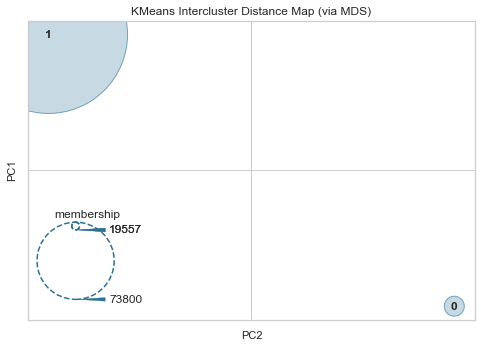

In [185]:
distance_visualizer(k_select, rfm_score_scaled)

/Users/oceaneyouyoutte/.local/lib/python3.8/site-packages/sklearn/manifold/_mds.py:512: UserWarning:

The MDS API has changed. ``fit`` now constructs an dissimilarity matrix from data. To use a custom dissimilarity matrix, set ``dissimilarity='precomputed'``.



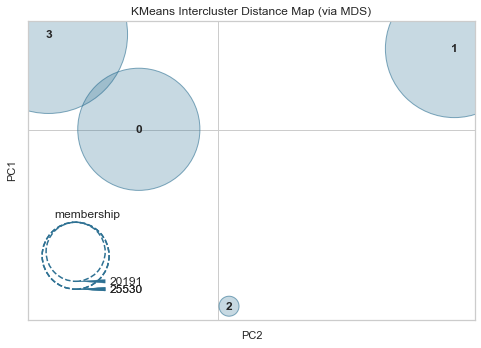

In [186]:
distance_visualizer(4, rfm_score_scaled)

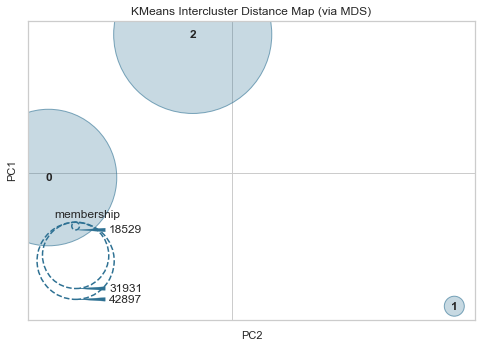

In [187]:
distance_visualizer(3, rfm_score_scaled)

Les clusters sont bien séparés pour les différents clustering (k = 2, 3, 4) malgré que les clusters 0 et 3 se chevauchent légèrement dans le clustering k = 4. Encore une fois, des clusters qui se chevauchent dans l'espace 2D, n'implique pas qu'ils se chevauchent dans l'espace des caractéristiques d'origine.


## <a id="15"></a> 3.4 Caractéristiques métiers des différents clustering

Nous allons désormais identifier les caractéristiques métiers des clusters des différents clustering (k = 2, 3 et 4).

**Modèle kmeans avec k = 2**

In [188]:
mod_rfm_score_final = KMeans(n_clusters=k_select, random_state=0)
mod_rfm_score_final.fit(rfm_score_scaled)

KMeans(n_clusters=2)

In [189]:
rfm_score_lab = mod_rfm_score_final.predict(rfm_score_scaled)

In [190]:
rfm_score_kmeans_scaled = rfm_score_scaled.copy()
rfm_score_kmeans_scaled['cluster'] = rfm_score_lab

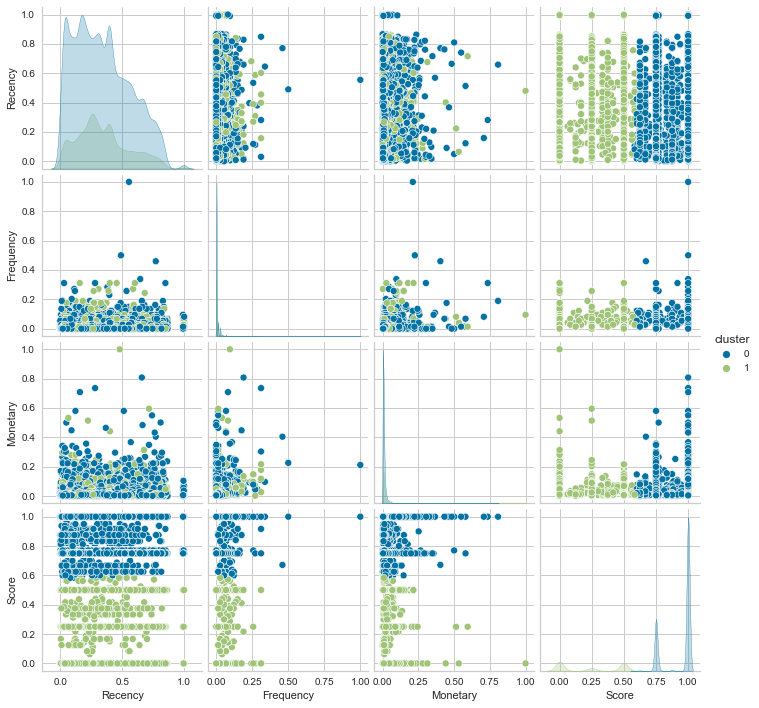

In [191]:
sns.pairplot(rfm_score_kmeans_scaled, hue="cluster")

In [193]:
rfm_score_kmeans = rfm_score.copy()
rfm_score_kmeans['cluster'] = rfm_score_lab

In [194]:
radar_cluster(rfm_score_kmeans, 'cluster', strat='mean')

Le modèle kmeans avec k=2 identifie les 2 clusters suivants : 
- cluster 1 : les clients ayant commandé récemment pour un montant faible et étant satisfaits.
- cluster 2 : les clients ayant commandé il y a longtemps, fréquemment et pour un montant élevé de commande et étant mécontents.

In [548]:
print('Paramètres du modèle kmeans : k=2.')
print('Silhouette Score : ', silhouette_score(rfm_score_scaled, rfm_score_lab))
print('Davies Bouldin Score : ', davies_bouldin_score(rfm_score_scaled,
                                                      rfm_score_lab))
print('Calinski Harabasz Score : ', calinski_harabasz_score(rfm_score_scaled,
                                                            rfm_score_lab))

Paramètres du modèle kmeans : k=2.
Silhouette Score :  0.5625376798876929
Davies Bouldin Score :  0.7424381340016313
Calinski Harabasz Score :  109250.60398044907


**Modèle kmeans avec k = 4**

In [196]:
mod_rfm_score_k4 = KMeans(n_clusters=4, random_state=0)
mod_rfm_score_k4.fit(rfm_score_scaled)

KMeans(n_clusters=4)

In [197]:
rfm_score_lab_k4 = mod_rfm_score_k4.predict(rfm_score_scaled)

In [198]:
rfm_score_kmeans_scaled_k4 = rfm_score_scaled.copy()
rfm_score_kmeans_scaled_k4['cluster'] = rfm_score_lab_k4

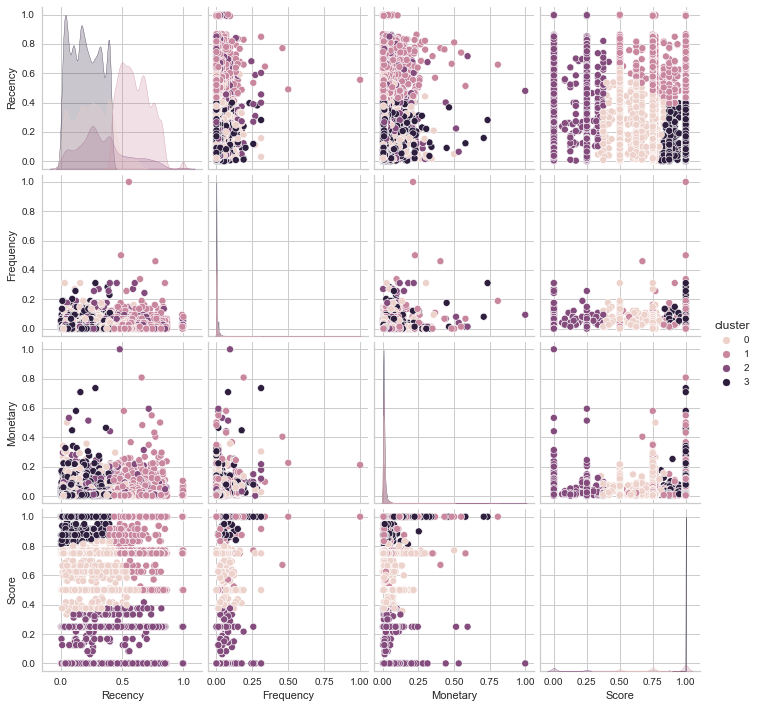

In [199]:
sns.pairplot(rfm_score_kmeans_scaled_k4, hue="cluster")

In [201]:
rfm_score_kmeans_k4 = rfm_score.copy()
rfm_score_kmeans_k4['cluster'] = rfm_score_lab_k4

In [550]:
rfm_score_kmeans_k4.groupby('cluster').mean()

,Recency,Frequency,Monetary,Score
cluster,,,,
0,175.739884,1.239067,143.014529,3.663306
1,422.333425,1.222505,149.946101,4.703419
2,236.203618,1.416195,172.411319,1.247690
3,139.550765,1.193594,143.020713,4.996611


In [549]:
radar_cluster(rfm_score_kmeans_scaled_k4, 'cluster', strat='mean')

Le modèle kmeans avec k=4 identifie les 4 clusters suivants :
- cluster 1 : les clients ayant commandé récemment pour un montant faible et étant assez satisfaits. 
- cluster 2 : les clients ayant commandé il y a longtemps pour un montant assez faible et qui sont satisfaits. 
- cluster 3 : les clients ayant commandé il y a peu de temps, fréquemment et pour un montant élevé. Ils sont mécontents. 
- cluster 4 : les clients ayant commandé récemment et pour un faible montant. Ils sont très satisfaits.

In [203]:
print('Modèle kmeans k=4')
print('Silhouette Score : ', silhouette_score(rfm_score_scaled,
                                              rfm_score_lab_k4))
print('Davies Bouldin Score : ', davies_bouldin_score(rfm_score_scaled,
                                                      rfm_score_lab_k4))
print('Calinski Harabasz Score : ', calinski_harabasz_score(rfm_score_scaled,
                                                            rfm_score_lab_k4))

Modèle kmeans k=4
Silhouette Score :  0.4832389088361402
Davies Bouldin Score :  0.7691137113798026
Calinski Harabasz Score :  127716.76693481895


**Modèle kmeans avec k = 3**

In [204]:
mod_rfm_score_k3 = KMeans(n_clusters=3, random_state=0)
mod_rfm_score_k3.fit(rfm_score_scaled)

KMeans(n_clusters=3)

In [205]:
rfm_score_lab_k3 = mod_rfm_score_k3.predict(rfm_score_scaled)

In [206]:
rfm_score_kmeans_scaled_k3 = rfm_score_scaled.copy()
rfm_score_kmeans_scaled_k3['cluster'] = rfm_score_lab_k3

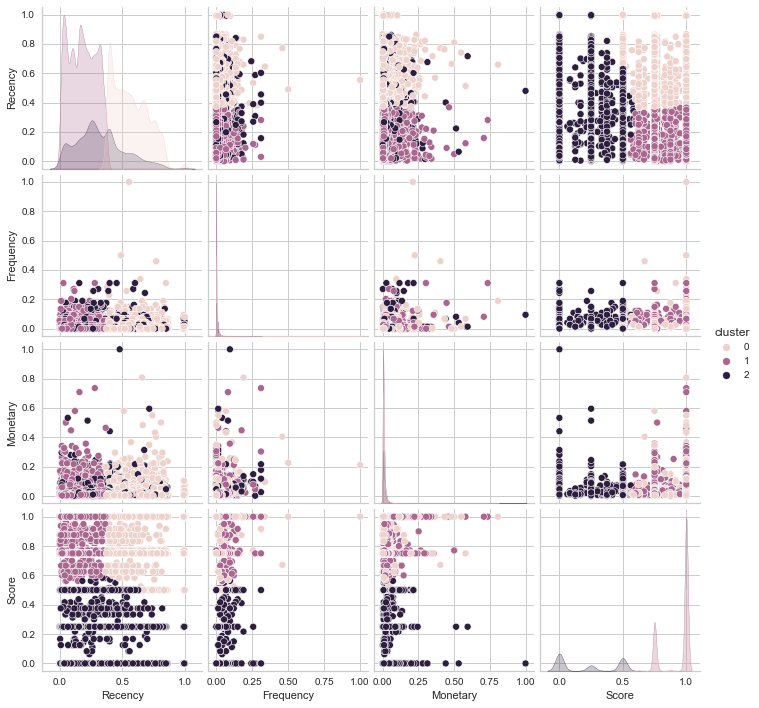

In [207]:
sns.pairplot(rfm_score_kmeans_scaled_k3, hue="cluster")

In [209]:
rfm_score_kmeans_k3 = rfm_score.copy()
rfm_score_kmeans_k3['cluster'] = rfm_score_lab_k3

In [551]:
rfm_score_kmeans_k3.groupby('cluster').mean()

,Recency,Frequency,Monetary,Score
cluster,,,,
0,393.625724,1.219473,148.204780,4.670069
1,125.476444,1.199478,143.861984,4.749967
2,224.959307,1.366884,160.438362,1.879857


In [210]:
radar_cluster(rfm_score_kmeans_scaled_k3, 'cluster', strat='mean')

Le modèle kmeans avec k=3 identifie les 3 clusters suivants :
- cluster 1 : les clients ayant commandé il y a longtemps, pour un montant assez faible et étant satisfaits.
- cluster 2 : les clients ayant commandé récemment, pour un montant faible. Ils sont très satisfaits.
- cluster 3 : les clients ayant commandé il y a peu de temps, fréquemment et pour un montant élevé. En revanche ils sont mécontents.

In [211]:
print('Modèle kmeans k=3')
print('Silhouette Score : ', silhouette_score(rfm_score_scaled,
                                              rfm_score_lab_k3))
print('Davies Bouldin Score : ', davies_bouldin_score(rfm_score_scaled,
                                                      rfm_score_lab_k3))
print('Calinski Harabasz Score : ', calinski_harabasz_score(rfm_score_scaled,
                                                            rfm_score_lab_k3))

Modèle kmeans k=3
Silhouette Score :  0.4667652890062585
Davies Bouldin Score :  0.7554485754816386
Calinski Harabasz Score :  123962.45289183184


In [ ]:
# Export du modèle
with open('models/kmeans_rfm_score_final', 'wb') as f1:
    pickle.dump(mod_rfm_score_final, f1)

# <a id="16"></a> 4. Segmentation RFM + score + livraison

Nous ajoutons au dataframe précédent 2 variables en lien avec les temps de livraison: le délais de livraison (différence entre la date d'achat et la date de livraison) ainsi que le retard de livraison (différence entre la date prévue de livraison et la date effective).

In [213]:
rfm_scoreliv = data[['customer_unique_id', 'time_since_last_order',
                     'nb_total_order', 'total_price',
                     'mean_review_score', 'mean_shipping_time',
                     'mean_delivery_delay']].copy()

In [214]:
rfm_scoreliv = rfm_scoreliv.set_index('customer_unique_id')
rfm_scoreliv.columns = ['Recency', 'Frequency', 'Monetary',
                        'Score', 'Livraison', 'Retard']

In [215]:
rfm_scoreliv.head()

,Recency,Frequency,Monetary,Score,Livraison,Retard
customer_unique_id,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,111,1,129.90,5.0,6,-5
0000b849f77a49e4a4ce2b2a4ca5be3f,114,1,18.90,4.0,3,-5
0000f46a3911fa3c0805444483337064,536,1,69.00,3.0,25,-2
0000f6ccb0745a6a4b88665a16c9f078,320,1,25.99,4.0,20,-12
0004aac84e0df4da2b147fca70cf8255,287,1,180.00,5.0,13,-8


In [216]:
col_quanti = rfm_scoreliv.select_dtypes(['int64', 'float64']).columns
col_quali = rfm_scoreliv.select_dtypes(['category', 'object', 'bool']).columns

minmax_scale = MinMaxScaler()
ohe = OneHotEncoder()

preprocessor = ColumnTransformer(transformers=[
    ('quanti', minmax_scale, col_quanti),
    ('quali', ohe, col_quali)
])

In [217]:
rfm_scoreliv_scaled = pd.DataFrame(preprocessor.fit_transform(rfm_scoreliv),
                                   index=rfm_scoreliv.index,
                                   columns=rfm_scoreliv.columns)
rfm_scoreliv_scaled.head()

,Recency,Frequency,Monetary,Score,Livraison,Retard
customer_unique_id,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,0.159942,0.0,0.009603,1.00,0.028708,0.423881
0000b849f77a49e4a4ce2b2a4ca5be3f,0.164265,0.0,0.001343,0.75,0.014354,0.423881
0000f46a3911fa3c0805444483337064,0.772334,0.0,0.005071,0.50,0.119617,0.432836
0000f6ccb0745a6a4b88665a16c9f078,0.461095,0.0,0.001871,0.75,0.095694,0.402985
0004aac84e0df4da2b147fca70cf8255,0.413545,0.0,0.013330,1.00,0.062201,0.414925


## <a id="17"></a> 4.1 KElbowVisualizer

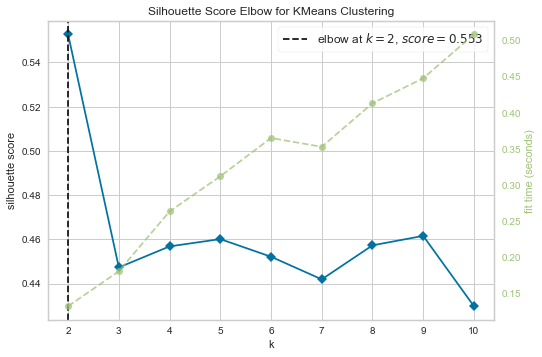

In [218]:
vis = elbow_visualizer(2, 11, rfm_scoreliv_scaled, 'silhouette')

In [219]:
recap_kmeans_rfm_scoreliv = pd.DataFrame(data={'k': np.arange(2, 11),
                                               'sil_scores': vis.k_scores_,
                                               'temps': vis.k_timers_})

In [220]:
recap_kmeans_rfm_scoreliv

,k,sil_scores,temps
0,2,0.552651,0.131253
1,3,0.447273,0.179799
2,4,0.456786,0.262808
3,5,0.460087,0.311606
4,6,0.452110,0.364747
5,7,0.441881,0.352479
6,8,0.457267,0.412976
7,9,0.461532,0.447618
8,10,0.429732,0.508519


In [221]:
k_select = vis.elbow_value_

In [222]:
k_select

2

La méthode du coude basé sur le score de silhouette nous indique que la segmentation en 2 clusters (k=2) semble la plus optimale.

## <a id="18"></a> 4.2 Silhouette Visualizer

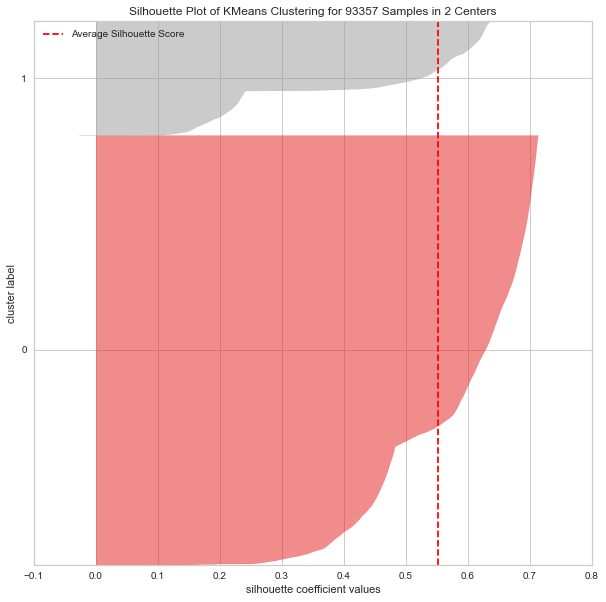

In [223]:
silhouette_visualizer(k_select, rfm_scoreliv_scaled)

Les clusters sont déséquilibrés. En effet, le clusters 0 est très large par rapport au cluster 1. Le silhouette score moyen est au-dessus de 0.55.

Nous allons désormais effectuer la méthode du coude avec d'autres métriques.

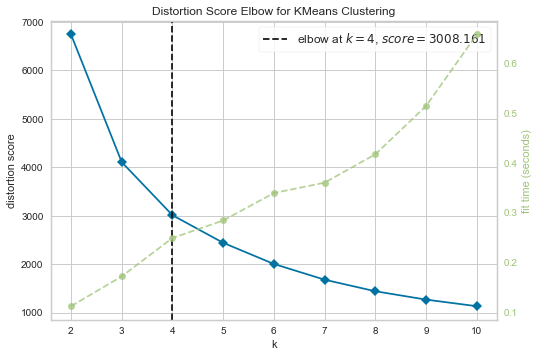

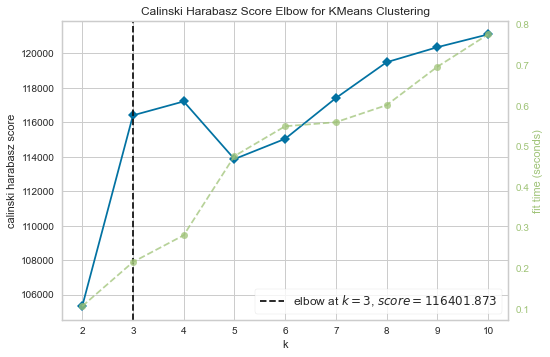

In [224]:
metrics = ["distortion", "calinski_harabasz"]

for m in metrics:
    elbow_visualizer(2, 11, rfm_scoreliv_scaled, m)

La méthode du coude avec le score de distortion nous indique un k optimal de 4. Avec la métrique 'calinski_harabasz', le choix se porte plutôt sur k = 3. 

Nous allons désormais également étudier le graphique silhouette pour ces différents clustering (k égal 4 et 3).

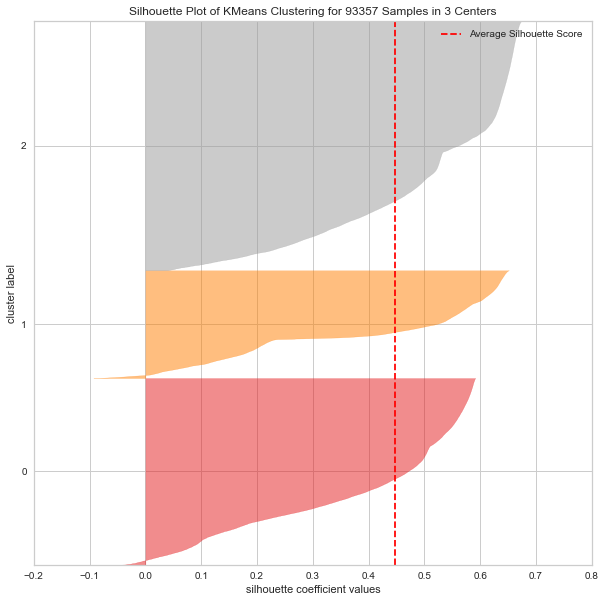

In [225]:
silhouette_visualizer(3, rfm_scoreliv_scaled)

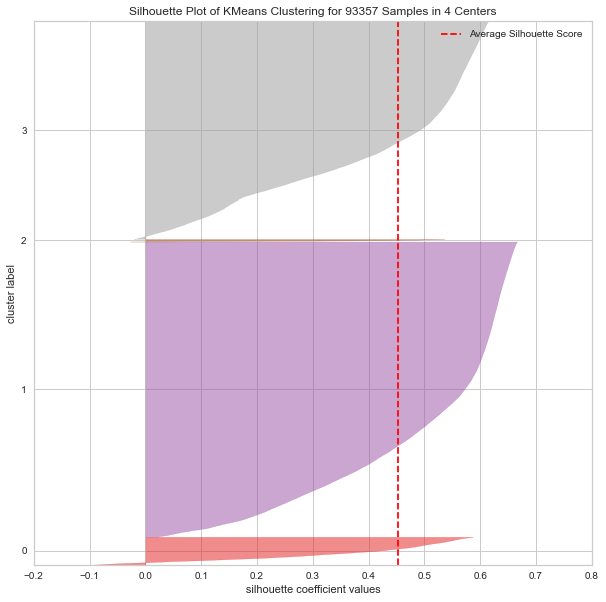

In [227]:
silhouette_visualizer(4, rfm_scoreliv)

Pour k = 3, le cluster 2 est plus large que le 0 et le 1 qui eux ont quelques observations qui semblent avoir un silhouette score négatif. Le silhouette score moyen est d'environ 0.45.

Pour k = 4, les clusters sont déséquilibrés. Les clusters 1 et 3 sont très larges tandis que les clusters 0 et 2 sont très fins. Deux des quatre clusters possèdent quelques observations ayant un silhouette score négatif. Le score moyen est d'environ 0.45 également.

## <a id="19"></a> 4.3 Distance intercluster

On observe désormais les distance entre nos clusters.

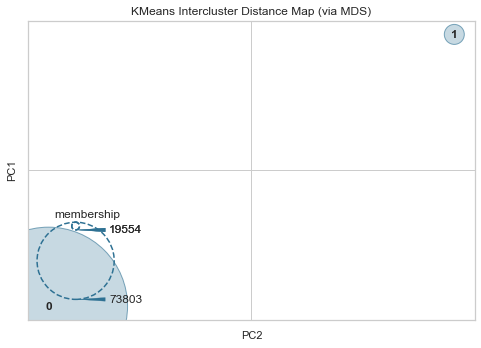

In [228]:
distance_visualizer(k_select, rfm_scoreliv_scaled)

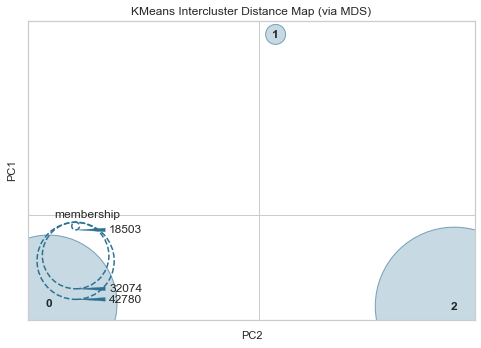

In [229]:
distance_visualizer(3, rfm_scoreliv_scaled)

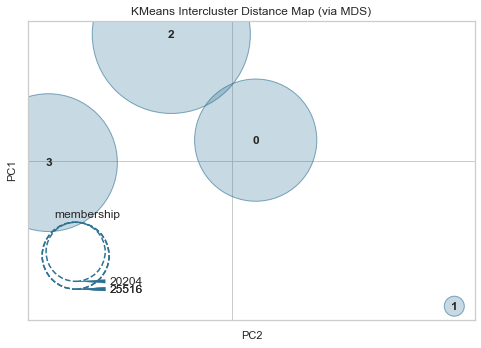

In [230]:
distance_visualizer(4, rfm_scoreliv_scaled)

Pour nos différents clustering, les clusters sont bien séparés sur les deux premières composantes principales. En ce qui concerne k=4, les clusters 0 et 2 se chevauchent très légèrement tandis que les autres semblent bien reparties et séparés. 

## <a id="20"></a> 4.4 Caractéristiques métier des différents clustering

Nous allons désormais identifier les caractéristiques métiers des différents clusters identifiés par les différentes valeurs de k (2, 3 et 4).

**Modèle kmeans avec k = 2**

In [447]:
mod_rfm_scoreliv_final = KMeans(n_clusters=k_select, random_state=0)
mod_rfm_scoreliv_final.fit(rfm_scoreliv_scaled)

KMeans(n_clusters=2, random_state=0)

In [448]:
rfm_scoreliv_lab = mod_rfm_scoreliv_final.predict(rfm_scoreliv_scaled)

In [449]:
rfm_scoreliv_kmeans_scaled = rfm_scoreliv_scaled.copy()
rfm_scoreliv_kmeans_scaled['cluster'] = rfm_scoreliv_lab

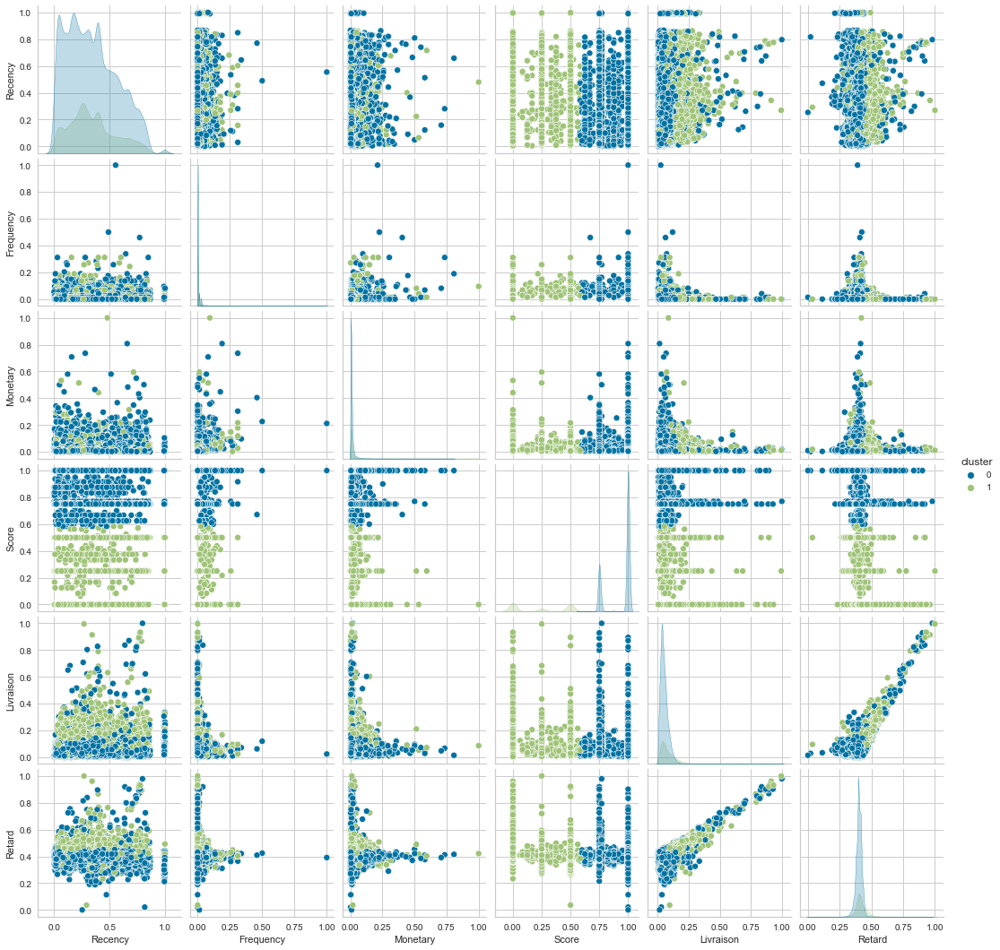

In [450]:
sns.pairplot(rfm_scoreliv_kmeans_scaled, hue="cluster")

In [452]:
rfm_scoreliv_kmeans = rfm_scoreliv.copy()
rfm_scoreliv_kmeans['cluster'] = rfm_scoreliv_lab

In [453]:
radar_cluster(rfm_scoreliv_kmeans, 'cluster', strat='mean')

Le kmeans avec k=2 identifie les 2 clusters suivants :
- cluster 1 : les clients ont un avis très bon et ont commandé récemment. Ils ont commandé pour un montant faible et avec des délais de livraison courts.
- cluster 2 : les clients ayant acheté fréquemment des paniers à montant élevés. Ils ont commandé il y a longtemps et ne sont pas satisfaits. Ils ont également eu un temps de livraison important ainsi qu'un retard.

In [552]:
print('Scores du modèle kmeans : k=2.')
print('Silhouette Score : ', silhouette_score(rfm_scoreliv_scaled,
                                              rfm_scoreliv_lab))
print('Davies Bouldin Score : ', davies_bouldin_score(rfm_scoreliv_scaled,
                                                      rfm_scoreliv_lab))
print('Calinski Harabasz Score : ',
      calinski_harabasz_score(rfm_scoreliv_scaled, rfm_scoreliv_lab))

Scores du modèle kmeans : k=2.
Silhouette Score :  0.5526508082443068
Davies Bouldin Score :  0.7629780414739165
Calinski Harabasz Score :  105321.62607353911


**Modèle kmeans avec k = 3**

In [455]:
mod_rfm_scoreliv_k3 = KMeans(n_clusters=3, random_state=0)
mod_rfm_scoreliv_k3.fit(rfm_scoreliv_scaled)

KMeans(n_clusters=3, random_state=0)

In [456]:
rfm_scoreliv_lab_k3 = mod_rfm_scoreliv_k3.predict(rfm_scoreliv_scaled)

In [457]:
rfm_scoreliv_kmeans_scaled_k3 = rfm_scoreliv_scaled.copy()
rfm_scoreliv_kmeans_scaled_k3['cluster'] = rfm_scoreliv_lab_k3

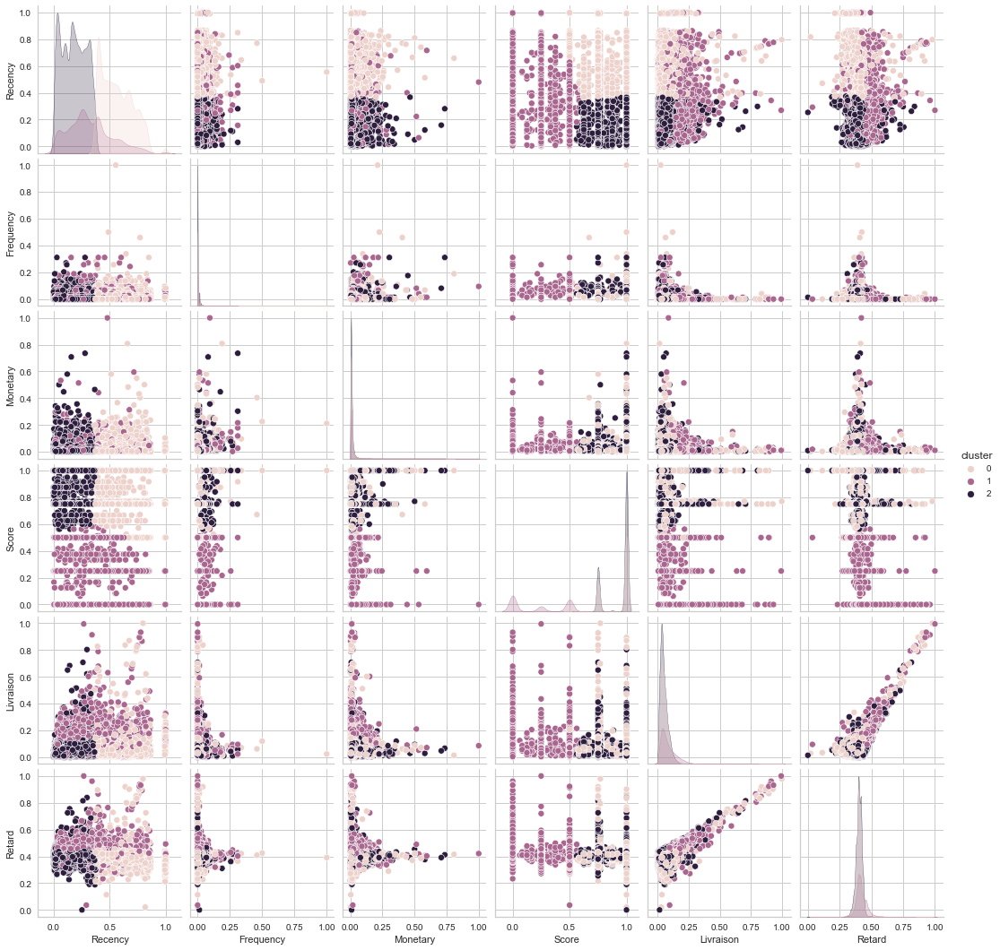

In [458]:
sns.pairplot(rfm_scoreliv_kmeans_scaled_k3, hue="cluster")

In [465]:
rfm_scoreliv_kmeans_k3 = rfm_scoreliv.copy()
rfm_scoreliv_kmeans_k3['cluster'] = rfm_scoreliv_lab_k3

In [466]:
rfm_scoreliv_kmeans_k3.groupby('cluster').mean()

,Recency,Frequency,Monetary,Score,Livraison,Retard
cluster,,,,,,
0,393.166085,1.219617,148.097035,4.668661,11.363566,-13.414635
1,224.666703,1.366859,160.502169,1.878283,17.694968,-6.880776
2,125.111734,1.199416,143.910725,4.750226,10.234993,-12.812529


In [467]:
radar_cluster(rfm_scoreliv_kmeans_k3, 'cluster', strat='mean')

Le kmeans avec k=3 identifie les 3 clusters suivants :
- cluster 1 : les clients ont commandé pour un montant de panier moyen et un temps de livraison relativement court. Ils ont commandé il y a longtemps et sont satisfaits.
- cluster 2 : les clients sont mécontents malgré le fait que ce soit eux qui aient commandé le plus fréquemment et pour les plus hauts montants. Ils ont eu des délais de livraison longs avec beaucoup de retard. Ils ont commandé il n'y a pas très longtemps.
- cluster 3 : les clients ont commandé récemment, pour un montant faible. Ils sont satisfaits malgré un léger retard dans leur livraison qui avait un délais court.

In [553]:
print('Scores du modèle kmeans : k=3.')
print('Silhouette Score : ', silhouette_score(rfm_scoreliv_scaled,
                                              rfm_scoreliv_lab_k3))
print('Davies Bouldin Score : ', davies_bouldin_score(rfm_scoreliv_scaled,
                                                      rfm_scoreliv_lab_k3))
print('Calinski Harabasz Score : ',
      calinski_harabasz_score(rfm_scoreliv_scaled, rfm_scoreliv_lab_k3))

Scores du modèle kmeans : k=3.
Silhouette Score :  0.4472727325073525
Davies Bouldin Score :  0.7819240825013726
Calinski Harabasz Score :  116401.8727415295


**Modèle kmeans avec k = 4**

In [468]:
mod_rfm_scoreliv_k4 = KMeans(n_clusters=4, random_state=0)
mod_rfm_scoreliv_k4.fit(rfm_scoreliv_scaled)

KMeans(n_clusters=4, random_state=0)

In [469]:
rfm_scoreliv_lab_k4 = mod_rfm_scoreliv_k4.predict(rfm_scoreliv_scaled)

In [470]:
rfm_scoreliv_kmeans_scaled_k4 = rfm_scoreliv_scaled.copy()
rfm_scoreliv_kmeans_scaled_k4['cluster'] = rfm_scoreliv_lab_k4

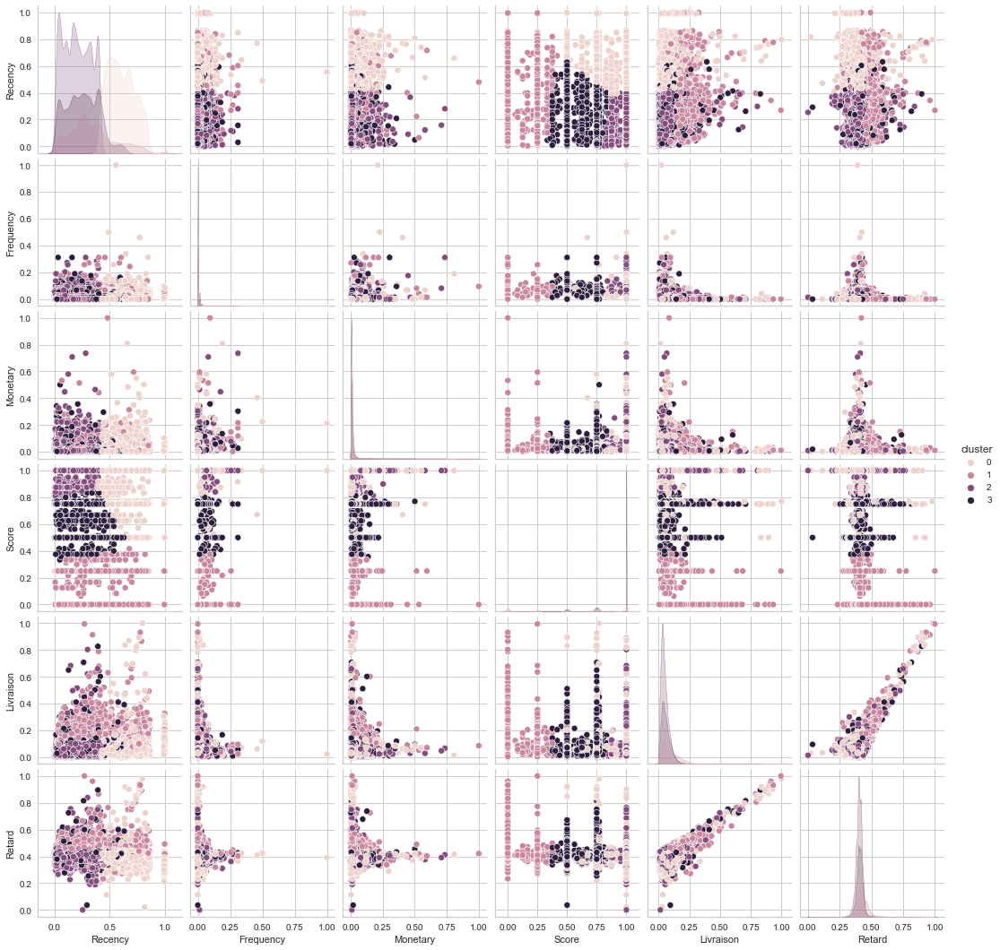

In [251]:
sns.pairplot(rfm_scoreliv_kmeans_scaled_k4, hue="cluster")

In [472]:
rfm_scoreliv_kmeans_k4 = rfm_scoreliv.copy()
rfm_scoreliv_kmeans_k4['cluster'] = rfm_scoreliv_lab_k4

In [473]:
rfm_scoreliv_kmeans_k4.groupby('cluster').mean()

,Recency,Frequency,Monetary,Score,Livraison,Retard
cluster,,,,,,
0,175.842358,1.239408,142.994228,3.663230,12.629083,-11.168481
1,236.206695,1.415673,172.426037,1.247484,19.785527,-5.089441
2,139.535216,1.193504,143.012625,4.996634,10.059456,-12.924207
3,422.339395,1.222605,149.970909,4.703847,10.986361,-13.993377


In [474]:
radar_cluster(rfm_scoreliv_kmeans_k4, 'cluster', strat='mean')

Le kmeans avec k=4 identifie les 4 clusters suivants :
- cluster 1 : les clients ont commandé assez récemment pour des montants faibles. Ils ont eu des délais de livraison assez courts avec un peu de retard. Ils sont moyennement satisfaits.
- cluster 2 : les clients sont mécontents malgré le fait que ce soit eux qui aient commandé le plus fréquemment et pour les plus hauts montants. Ils ont eu des délais de livraison longs avec beaucoup de retard. Ils ont commandé il n'y a pas très longtemps.
- cluster 3 : les clients ont commandé récemment, pour un montant faible. Ils sont satisfaits malgré un léger retard dans leur livraison qui avait un délais court.
- cluster 4 : les clients ont commandé pour un montant de panier moyen et un temps de livraison relativement court. Ils ont commandé il y a longtemps et sont satisfaits.

In [255]:
print('Modèle kmeans k=4')
print('Silhouette Score : ', silhouette_score(rfm_scoreliv_scaled,
                                              rfm_scoreliv_lab_k4))
print('Davies Bouldin Score : ', davies_bouldin_score(rfm_scoreliv_scaled,
                                                      rfm_scoreliv_lab_k4))
print('Calinski Harabasz Score : ',
      calinski_harabasz_score(rfm_scoreliv_scaled, rfm_scoreliv_lab_k4))

Modèle kmeans k=4
Silhouette Score :  0.45677177012984127
Davies Bouldin Score :  0.8097795581589293
Calinski Harabasz Score :  117208.52423907284


In [ ]:
# Export du modèle
with open('models/kmeans_rfm_scoreliv_final', 'wb') as f1:
    pickle.dump(mod_rfm_scoreliv_final, f1)

# <a id="21"></a> 5. Segmentation avec les catégories des articles

On ajoute ici les catégories des articles ainsi que quelques autres variables telles que les frais de livraison, le type de paiement ou encore les échéances de paiement.

In [25]:
data.head()

,customer_unique_id,order_purchase_timestamp,order_delivered_customer_date,order_estimated_delivery_date,time_since_first_order,time_since_last_order,mean_shipping_time,mean_delivery_delay,customer_city,customer_state,nb_total_order,nb_total_item,total_price,mean_price,total_freight_value,mean_freight_value,payment_type,mean_payment_installments,total_payment_value,mean_payment_value,mean_review_score,seller_city,seller_state,cat
0,0000366f3b9a7992bf8c76cfdf3221e2,2018-05-10 10:56:27,2018-05-16 20:48:37,2018-05-21 00:00:00,111,111,6,-5,cajamar,SP,1,1,129.90,129.90,12.00,12.00,credit_card,8.0,141.90,141.90,5.0,piracicaba,SP,bed_bath_table
1,0000b849f77a49e4a4ce2b2a4ca5be3f,2018-05-07 11:11:27,2018-05-10 18:02:42,2018-05-15 00:00:00,114,114,3,-5,osasco,SP,1,1,18.90,18.90,8.29,8.29,credit_card,1.0,27.19,27.19,4.0,sao paulo,SP,health_beauty
2,0000f46a3911fa3c0805444483337064,2017-03-10 21:05:03,2017-04-05 14:38:47,2017-04-07 00:00:00,536,536,25,-2,sao jose,SC,1,1,69.00,69.00,17.22,17.22,credit_card,8.0,86.22,86.22,3.0,campo limpo paulista,SP,stationery
3,0000f6ccb0745a6a4b88665a16c9f078,2017-10-12 20:29:41,2017-11-01 21:23:05,2017-11-13 00:00:00,320,320,20,-12,belem,PA,1,1,25.99,25.99,17.63,17.63,credit_card,4.0,43.62,43.62,4.0,sao paulo,SP,telephony
4,0004aac84e0df4da2b147fca70cf8255,2017-11-14 19:45:42,2017-11-27 23:08:56,2017-12-05 00:00:00,287,287,13,-8,sorocaba,SP,1,1,180.00,180.00,16.89,16.89,credit_card,6.0,196.89,196.89,5.0,jacarei,SP,telephony


In [26]:
data_all = data.drop(['order_purchase_timestamp',
                      'order_delivered_customer_date',
                      'order_estimated_delivery_date', 'customer_city',
                      'customer_state', 'seller_city', 'seller_state'], axis=1)

In [27]:
data_all = data_all.set_index('customer_unique_id')

In [28]:
data_all.shape

(93357, 16)

In [29]:
data_all.head()

,time_since_first_order,time_since_last_order,mean_shipping_time,mean_delivery_delay,nb_total_order,nb_total_item,total_price,mean_price,total_freight_value,mean_freight_value,payment_type,mean_payment_installments,total_payment_value,mean_payment_value,mean_review_score,cat
customer_unique_id,,,,,,,,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,111,111,6,-5,1,1,129.90,129.90,12.00,12.00,credit_card,8.0,141.90,141.90,5.0,bed_bath_table
0000b849f77a49e4a4ce2b2a4ca5be3f,114,114,3,-5,1,1,18.90,18.90,8.29,8.29,credit_card,1.0,27.19,27.19,4.0,health_beauty
0000f46a3911fa3c0805444483337064,536,536,25,-2,1,1,69.00,69.00,17.22,17.22,credit_card,8.0,86.22,86.22,3.0,stationery
0000f6ccb0745a6a4b88665a16c9f078,320,320,20,-12,1,1,25.99,25.99,17.63,17.63,credit_card,4.0,43.62,43.62,4.0,telephony
0004aac84e0df4da2b147fca70cf8255,287,287,13,-8,1,1,180.00,180.00,16.89,16.89,credit_card,6.0,196.89,196.89,5.0,telephony


In [331]:
data_all.dtypes

time_since_first_order         int64
time_since_last_order          int64
mean_shipping_time             int64
mean_delivery_delay            int64
nb_total_order                 int64
nb_total_item                  int64
total_price                  float64
mean_price                   float64
total_freight_value          float64
mean_freight_value           float64
payment_type                  object
mean_payment_installments    float64
total_payment_value          float64
mean_payment_value           float64
mean_review_score            float64
cat                           object
dtype: object

In [30]:
col_quanti = data_all.select_dtypes(['int64', 'float64']).columns
col_quali = data_all.select_dtypes(['category', 'object', 'bool']).columns

minmax_scale = MinMaxScaler()
ohe = OneHotEncoder(sparse=False)

In [31]:
preprocessor = ColumnTransformer(transformers=[
    ('quanti', minmax_scale, col_quanti),
    ('quali', ohe, col_quali)
])

In [32]:
data_all_scaled = pd.DataFrame(preprocessor.fit_transform(data_all),
                               index=data_all.index,
                               columns=preprocessor.get_feature_names_out())
data_all_scaled.head()

,quanti__time_since_first_order,quanti__time_since_last_order,quanti__mean_shipping_time,quanti__mean_delivery_delay,quanti__nb_total_order,quanti__nb_total_item,quanti__total_price,quanti__mean_price,quanti__total_freight_value,quanti__mean_freight_value,quanti__mean_payment_installments,quanti__total_payment_value,quanti__mean_payment_value,quanti__mean_review_score,quali__payment_type_boleto,quali__payment_type_credit_card,quali__payment_type_debit_card,quali__payment_type_voucher,quali__cat_agro_industry_and_commerce,quali__cat_air_conditioning,quali__cat_art,quali__cat_arts_and_craftmanship,quali__cat_audio,quali__cat_auto,quali__cat_baby,quali__cat_bed_bath_table,quali__cat_books_general_interest,quali__cat_books_imported,quali__cat_books_technical,quali__cat_cds_dvds_musicals,quali__cat_christmas_supplies,quali__cat_cine_photo,quali__cat_computers,quali__cat_computers_accessories,quali__cat_consoles_games,quali__cat_construction_tools_construction,quali__cat_construction_tools_lights,quali__cat_construction_tools_safety,quali__cat_cool_stuff,quali__cat_costruction_tools_garden,quali__cat_costruction_tools_tools,quali__cat_diapers_and_hygiene,quali__cat_drinks,quali__cat_dvds_blu_ray,quali__cat_electronics,quali__cat_fashio_female_clothing,quali__cat_fashion_bags_accessories,quali__cat_fashion_childrens_clothes,quali__cat_fashion_male_clothing,quali__cat_fashion_shoes,quali__cat_fashion_sport,quali__cat_fashion_underwear_beach,quali__cat_fixed_telephony,quali__cat_flowers,quali__cat_food,quali__cat_food_drink,quali__cat_furniture_bedroom,quali__cat_furniture_decor,quali__cat_furniture_living_room,quali__cat_furniture_mattress_and_upholstery,quali__cat_garden_tools,quali__cat_health_beauty,quali__cat_home_appliances,quali__cat_home_appliances_2,quali__cat_home_comfort_2,quali__cat_home_confort,quali__cat_home_construction,quali__cat_housewares,quali__cat_industry_commerce_and_business,quali__cat_kitchen_dining_laundry_garden_furniture,quali__cat_kitchen_portables_and_food_preparators,quali__cat_la_cuisine,quali__cat_luggage_accessories,quali__cat_market_place,quali__cat_music,quali__cat_musical_instruments,quali__cat_office_furniture,quali__cat_party_supplies,quali__cat_pc_gamer,quali__cat_perfumery,quali__cat_pet_shop,quali__cat_security_and_services,quali__cat_signaling_and_security,quali__cat_small_appliances,quali__cat_small_appliances_home_oven_and_coffee,quali__cat_sports_leisure,quali__cat_stationery,quali__cat_tablets_printing_image,quali__cat_telephony,quali__cat_toys,quali__cat_uncategorized,quali__cat_watches_gifts
customer_unique_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,0.159712,0.159942,0.028708,0.423881,0.0,0.0,0.009603,0.019164,0.006685,0.029291,0.333333,0.001210,0.010250,1.00,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
0000b849f77a49e4a4ce2b2a4ca5be3f,0.164029,0.164265,0.014354,0.423881,0.0,0.0,0.001343,0.002680,0.004618,0.020235,0.041667,0.000161,0.001854,0.75,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
0000f46a3911fa3c0805444483337064,0.771223,0.772334,0.119617,0.432836,0.0,0.0,0.005071,0.010120,0.009594,0.042033,0.333333,0.000701,0.006175,0.50,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0

## <a id="22"></a> 5.1 KElbowVisualizer

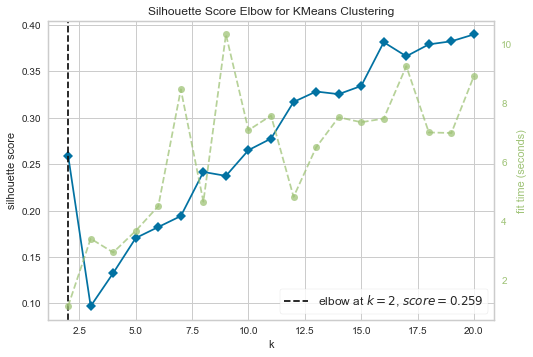

In [335]:
vis = elbow_visualizer(2, 21, data_all_scaled, 'silhouette')

Nous élargissons ici notre recherche de clusters puisque notre dataframe d'entrée comporte beaucoup de variables (notamment catégorielles).

La méthode du coude basé sur le score de silhouette nous indique que la segmentation en 2 clusters (k=2) semble la plus optimale.

In [336]:
recap_kmeans_all = pd.DataFrame(data={'k': np.arange(2, 21),
                                      'sil_scores': vis.k_scores_,
                                      'temps': vis.k_timers_})

In [337]:
recap_kmeans_all

,k,sil_scores,temps
0,2,0.259263,1.118957
1,3,0.097049,3.404723
2,4,0.132732,2.937844
3,5,0.170461,3.669516
4,6,0.182319,4.503448
5,7,0.194104,8.453462
6,8,0.241594,4.653574
7,9,0.237354,10.314097
8,10,0.265083,7.073341
9,11,0.277502,7.568223


In [338]:
k_select = vis.elbow_value_
k_select

2

## <a id="23"></a> 5.2 Silhouette Visualizer

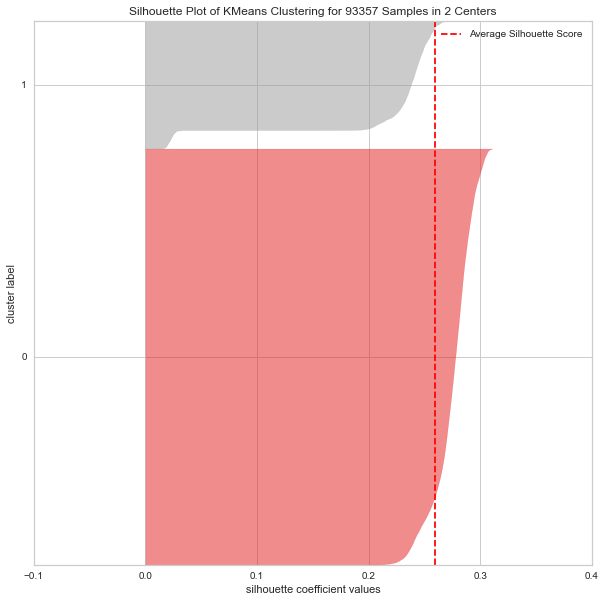

In [339]:
silhouette_visualizer(k_select, data_all_scaled)

On constate ici que les deux clusters sont assez larges, bien que le cluster 0 le soit beaucoup plus. La largeur de chaque silhouette est proportionnelle au nombre d'échantillons affectés au cluster. Les silhouettes score sont positifs, ce qui signifie qu'aucune erreur n'a été effectuée. Le silhouette score moyen se situe près de 0.27.

Nous allons désormais effectuer la méthode du coude avec d'autres métriques.

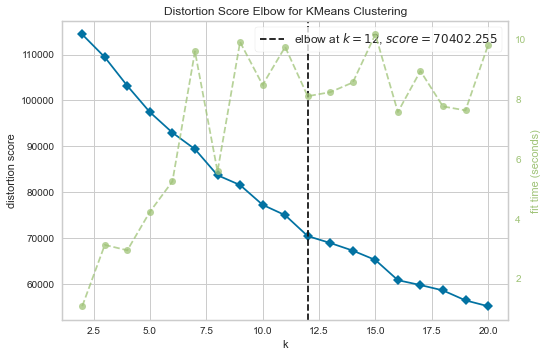

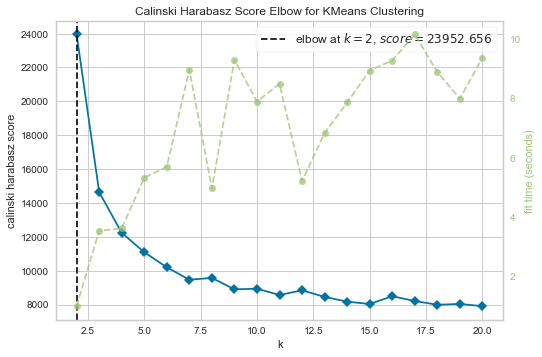

In [340]:
metrics = ["distortion", "calinski_harabasz"]

for m in metrics:
    elbow_visualizer(2, 21, data_all_scaled, m)

La méthode du coude avec le score de distortion nous indique un k optimal de 12. Avec la métrique 'calinski_harabasz', le choix se porte plutôt sur k = 2. 

Nous allons désormais également étudier le graphique silhouette pour le clustering k égal à 12.

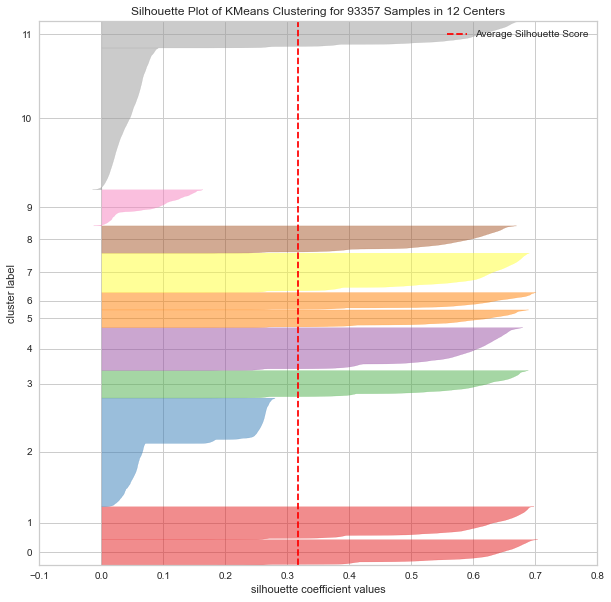

In [341]:
silhouette_visualizer(12, data_all_scaled)

Les clusters sont très désiquilibrés. Il y a peu d'observations ayant un silhouette score négatif. Cependant, plusieurs clusters ont un silhouette score inférieur au silhouette score moyen qui est au-dessus de 0.3. Cela signifie que les observations du cluster sont trop proches des autres clusters.
Avec un nombre de cluster aussi important pour ce data set, il n'est pas incohérent que certains clusters soient mal séparés.

## <a id="24"></a> 5.3 Distance intercluster

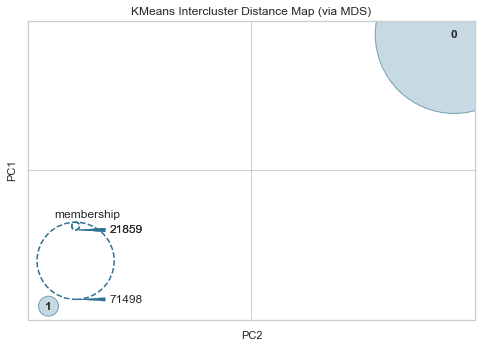

In [342]:
distance_visualizer(k_select, data_all_scaled)

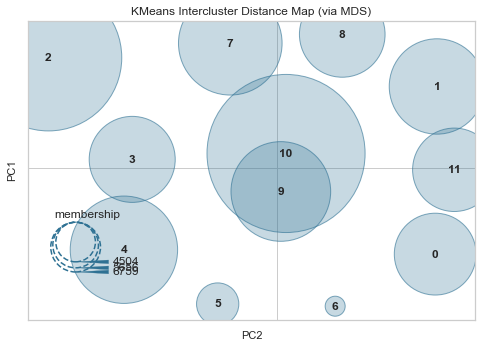

In [343]:
distance_visualizer(12, data_all_scaled)

Les clusters sont bien séparés pour k = 2. En revanche, comme on pouvait s'y attendre, pour k = 12, certains clusters se chevauchent sur les deux premières composantes principales. 

## <a id="25"></a> 5.4 Caractéristiques métiers des différents clustering

Nous allons désormais identifier les caractéristiques métiers des clusters des différents clustering (k = 2 et 12).

**Modèle kmeans avec k = 2**

In [344]:
mod_data_all_final = KMeans(n_clusters=k_select, random_state=0)
mod_data_all_final.fit(data_all_scaled)

KMeans(n_clusters=2)

In [345]:
data_all_lab = mod_data_all_final.predict(data_all_scaled)

In [346]:
data_all_kmeans_scaled = data_all_scaled.copy()
data_all_kmeans_scaled['cluster'] = data_all_lab

In [348]:
data_all_kmeans = data_all.copy()
data_all_kmeans['cluster'] = data_all_lab

In [349]:
data_all_kmeans.groupby('cluster').mean()

,time_since_first_order,time_since_last_order,mean_shipping_time,mean_delivery_delay,nb_total_order,nb_total_item,total_price,mean_price,total_freight_value,mean_freight_value,mean_payment_installments,total_payment_value,mean_payment_value,mean_review_score
cluster,,,,,,,,,,,,,,
0,238.133095,235.482293,11.895396,-12.038561,1.215223,1.215223,152.291573,131.851896,24.430966,20.363458,3.478322,215.444783,163.701760,4.152551
1,244.320554,241.693765,12.774647,-11.206505,1.319091,1.319091,136.684839,106.154971,25.871899,19.599366,1.009639,204.861793,138.442549,4.154450


In [350]:
radar_cluster(data_all_kmeans_scaled, 'cluster', strat='mean')

In [356]:
# Modèle kmeans : k=2
print('Silhouette Score : ', silhouette_score(data_all_scaled, data_all_lab))
print('Davies Bouldin Score : ', davies_bouldin_score(data_all_scaled,
                                                      data_all_lab))
print('Calinski Harabasz Score : ', calinski_harabasz_score(data_all_scaled,
                                                            data_all_lab))

Silhouette Score :  0.259263045580492
Davies Bouldin Score :  1.695487939761598
Calinski Harabasz Score :  23952.656158341324


**Modèle kmeans avec k = 12**

In [33]:
mod_data_all_final_k12 = KMeans(n_clusters=12, random_state=0)
mod_data_all_final_k12.fit(data_all_scaled)

KMeans(n_clusters=12, random_state=0)

In [34]:
data_all_lab_k12 = mod_data_all_final_k12.predict(data_all_scaled)

In [35]:
data_all_kmeans_scaled_k12 = data_all_scaled.copy()
data_all_kmeans_scaled_k12['cluster'] = data_all_lab_k12

In [36]:
data_all_kmeans_k12 = data_all.copy()
data_all_kmeans_k12['cluster'] = data_all_lab_k12

In [37]:
data_all_kmeans_k12.groupby('cluster').mean()

,time_since_first_order,time_since_last_order,mean_shipping_time,mean_delivery_delay,nb_total_order,nb_total_item,total_price,mean_price,total_freight_value,mean_freight_value,mean_payment_installments,total_payment_value,mean_payment_value,mean_review_score
cluster,,,,,,,,,,,,,,
0,201.489051,200.230839,12.366788,-11.917883,1.124088,1.124088,237.994879,218.583029,19.063896,17.121751,4.269750,262.643476,237.212932,4.129631
1,245.722242,242.923975,11.638260,-12.056047,1.224540,1.224540,143.613140,122.300261,24.003895,19.975339,2.800862,192.150688,151.779564,4.220499
2,248.956540,246.199422,13.036341,-11.122832,1.215050,1.215050,126.820934,107.470476,23.904772,19.752974,1.007831,213.843500,144.250779,4.154437
3,229.378923,226.400127,12.458227,-12.428117,1.256149,1.256149,143.844022,116.358431,23.716766,18.934722,2.602236,215.429025,150.389558,4.097968
4,245.032727,240.476100,12.384166,-11.493074,1.395437,1.395437,131.012865,98.442166,25.768715,18.778116,4.089058,206.572617,134.317710,4.004356
5,250.147541,248.831803,12.107869,-11.433443,1.161639,1.161639,87.582823,75.298163,18.259659,15.615012,2.591397,123.094538,94.618072,4.070994
6,273.944333,272.907780,10.957076,-12.331657,1.127431,1.127431,135.468588,124.137481,21.575000,19.155694,3.241067,164.674748,146.083645,4.250743
7,214.635893,212.419441,11.544459,-11.954727,1.183459,1.183459,158.233142,140.797777,22.448494,19.318787,3.522656,200.404811,167.166058,4.234499
8,263.372063,259.611918,12.276591,-12.605724,1.479710,1.479710,131.455017,97.635327,30.625167,21.537893,3.504277,237.854904,141.582489,4.077146


In [38]:
radar_cluster(data_all_kmeans_scaled_k12, 'cluster', strat='mean')

In [39]:
# Modèle kmeans : k=12
print('Silhouette Score : ', silhouette_score(data_all_scaled,
                                              data_all_lab_k12))
print('Davies Bouldin Score : ', davies_bouldin_score(data_all_scaled,
                                                      data_all_lab_k12))
print('Calinski Harabasz Score : ', calinski_harabasz_score(data_all_scaled,
                                                            data_all_lab_k12))

Silhouette Score :  0.3169264309998857
Davies Bouldin Score :  1.7408378396406556
Calinski Harabasz Score :  8840.90495491334


Avec autant de features, les clusters (que ce soit pour k = 2 ou k = 12) sont très peu identifiables et interprétables. Il semblerait que les clusters soient en grande partie caractérisés par les catégories de produits.

Ce modèle avec ces features en entrée n'est donc pas adapté pour notre problème. Nous allons réduire nos données d'entrée pour la suite de l'étude.

In [ ]:
# Export du modèle
with open('models/kmeans_data_all_final', 'wb') as f1:
    pickle.dump(mod_data_all_final_k12, f1)

# <a id="26"></a> 6. Segmentation finale

In [60]:
X = data[['customer_unique_id', 'time_since_last_order', 'mean_shipping_time',
          'nb_total_order', 'nb_total_item', 'total_price',
          'mean_freight_value', 'mean_payment_installments',
          'mean_review_score']].copy()

In [32]:
X = X.set_index('customer_unique_id')

In [33]:
X.shape

(93357, 8)

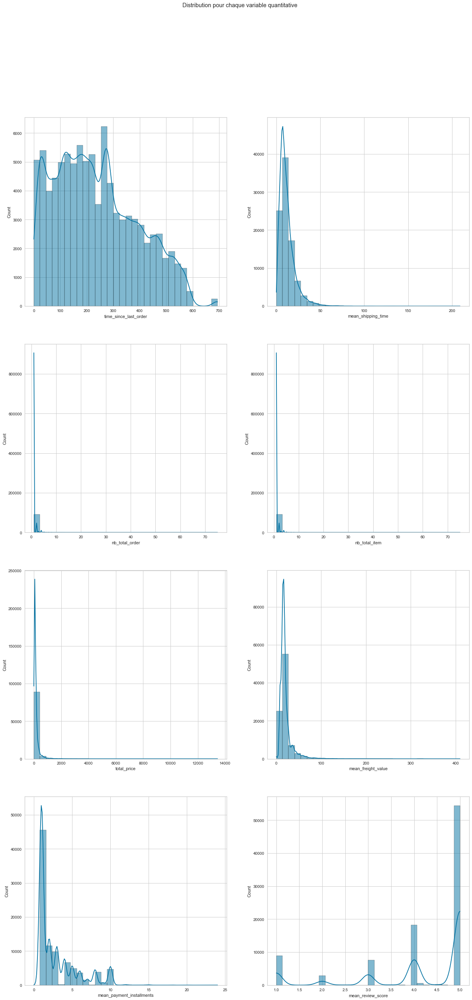

In [554]:
fc.distribution(X, X.columns, 4, 2)

In [34]:
col_quanti = X.select_dtypes(['int64', 'float64']).columns
col_quali = X.select_dtypes(['category', 'object', 'bool']).columns

minmax_scale = MinMaxScaler()
ohe = OneHotEncoder(sparse=False)

In [35]:
preprocessor = ColumnTransformer(transformers=[
    ('quanti', minmax_scale, col_quanti),
    ('quali', ohe, col_quali)
])

In [36]:
X_scaled = pd.DataFrame(preprocessor.fit_transform(X),
                        index=X.index,
                        columns=X.columns)
X_scaled.head()

,time_since_last_order,mean_shipping_time,nb_total_order,nb_total_item,total_price,mean_freight_value,mean_payment_installments,mean_review_score
customer_unique_id,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,0.159942,0.028708,0.0,0.0,0.009603,0.029291,0.333333,1.00
0000b849f77a49e4a4ce2b2a4ca5be3f,0.164265,0.014354,0.0,0.0,0.001343,0.020235,0.041667,0.75
0000f46a3911fa3c0805444483337064,0.772334,0.119617,0.0,0.0,0.005071,0.042033,0.333333,0.50
0000f6ccb0745a6a4b88665a16c9f078,0.461095,0.095694,0.0,0.0,0.001871,0.043034,0.166667,0.75
0004aac84e0df4da2b147fca70cf8255,0.413545,0.062201,0.0,0.0,0.013330,0.041227,0.250000,1.00


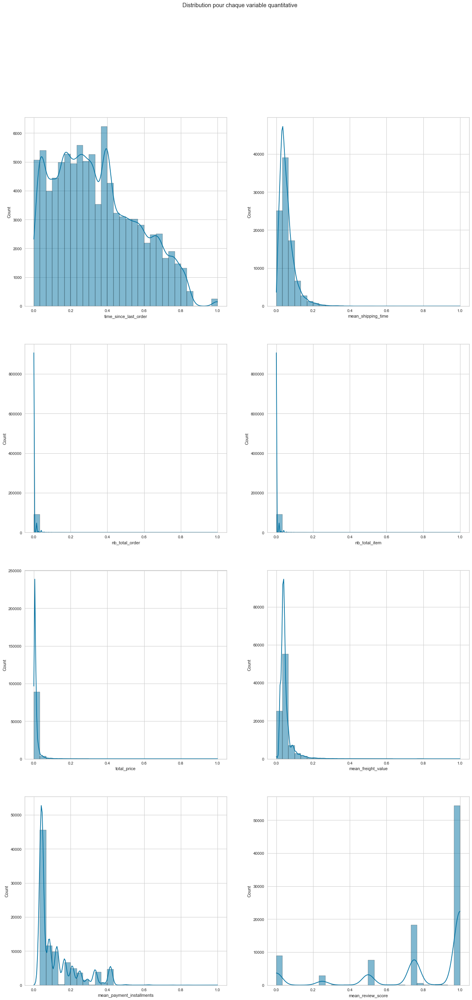

In [541]:
fc.distribution(X_scaled, X_scaled.columns, 4, 2)

## <a id="27"></a> 6.1 KElbowVisualizer

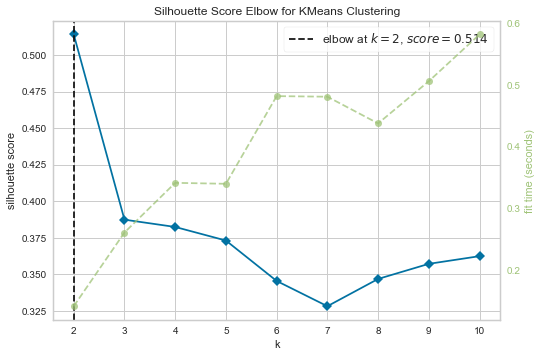

In [419]:
vis = elbow_visualizer(2, 11, X_scaled, 'silhouette')

In [420]:
recap_kmeans = pd.DataFrame(data={'k': np.arange(2, 11),
                                  'sil_scores': vis.k_scores_,
                                  'temps': vis.k_timers_})

In [421]:
recap_kmeans

,k,sil_scores,temps
0,2,0.514110,0.140560
1,3,0.387280,0.260213
2,4,0.382284,0.340890
3,5,0.372992,0.339341
4,6,0.345320,0.481713
5,7,0.328028,0.480756
6,8,0.346702,0.437383
7,9,0.357043,0.505942
8,10,0.362293,0.581926


In [422]:
k_select = vis.elbow_value_
k_select

2

La méthode du coude basée sur le score de silhouette nous indique que la segmentation en 2 clusters (k=2) semble la plus optimale.

## <a id="28"></a> 6.2 Silhouette Visualizer

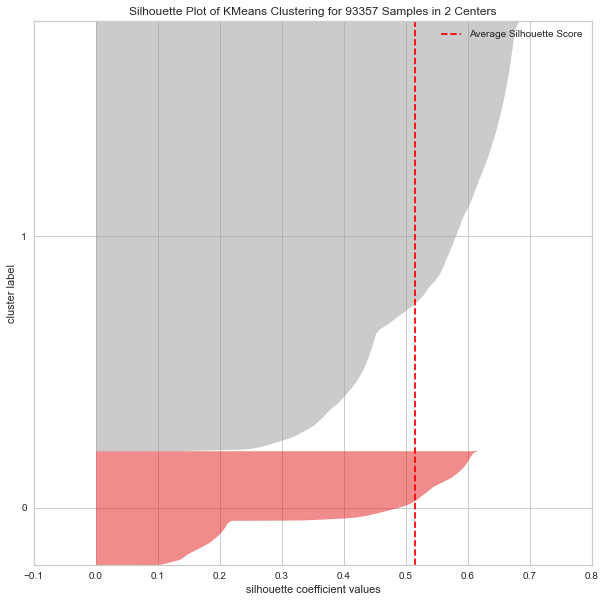

In [423]:
silhouette_visualizer(k_select, X_scaled)

On constate ici un déséquilibre dans les clusters. Le cluster 1 est bien plus large que le cluster 0. En revanche, aucun observation n'a de silhouette score négatif et le silhouette score moyen est supérieur à 0.5.

Nous allons désormais effectuer la méthode du coude avec d'autres métriques.

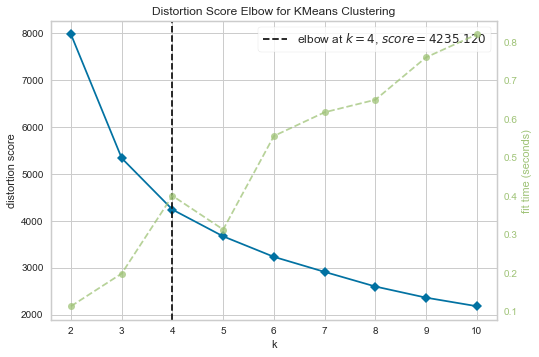

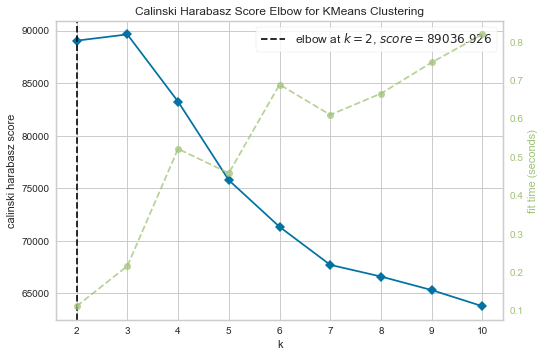

In [424]:
metrics = ["distortion", "calinski_harabasz"]

for m in metrics:
    elbow_visualizer(2, 11, X_scaled, m)

La méthode du coude avec le score de distortion nous indique un k optimal de 4. Avec la métrique 'calinski_harabasz', le choix se porte plutôt sur k = 2. 

Nous allons désormais également étudier le graphique silhouette pour le clustering k égal 4.

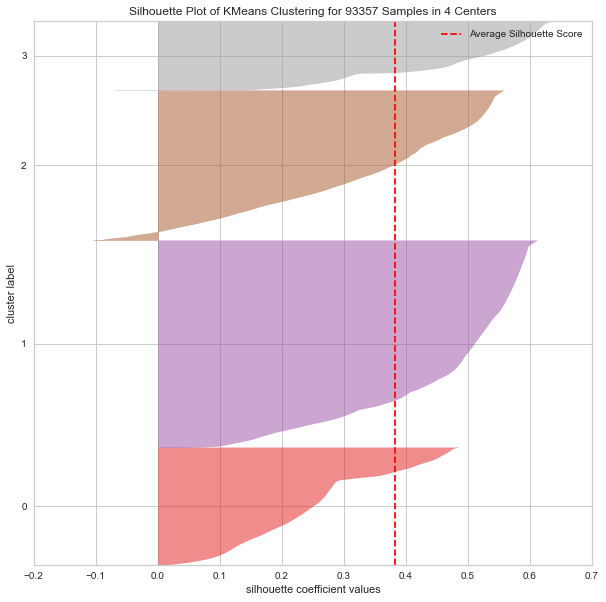

In [425]:
silhouette_visualizer(4, X_scaled)

Le silhouette score moyen est d'environ 0.4. Les clusters sont un peu déséquilibrés, avec un cluster 1 plus large que les autres. Les clusters 2 et 3 possèdent quelques observations avec un silhouette score négatif. Elles sont possiblement mal classées. 

## <a id="29"></a> 6.3 Distance intercluster

On observe désormais les distance entre nos clusters.

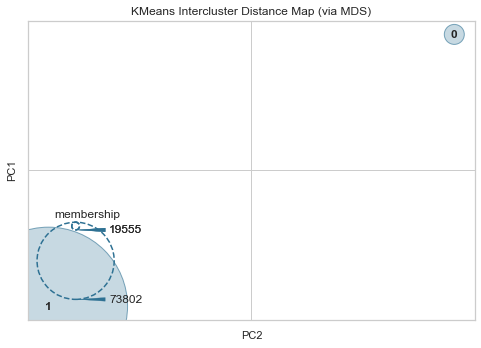

In [426]:
distance_visualizer(k_select, X_scaled)

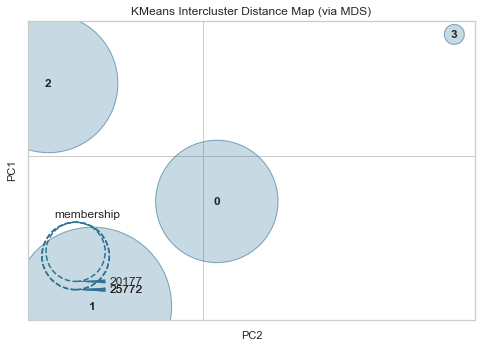

In [427]:
distance_visualizer(4, X_scaled)

On constate ici que, pour k=2 et 4, les clusters sont bien séparés sur les deux premières composantes principales. 

## <a id="30"></a> 6.4 Caractéristiques métiers des différents clustering

Nous allons désormais identifier les caractéristiques métiers des clusters des différents clustering (k = 2 et 4).

**Modèle kmeans avec k = 2**

In [475]:
mod_X_final = KMeans(n_clusters=k_select, random_state=0)
mod_X_final.fit(X_scaled)

KMeans(n_clusters=2, random_state=0)

In [476]:
X_lab = mod_X_final.predict(X_scaled)

In [477]:
X_kmeans_scaled = X_scaled.copy()
X_kmeans_scaled['cluster'] = X_lab

In [478]:
X_kmeans_scaled.groupby('cluster').mean()

,time_since_last_order,mean_shipping_time,nb_total_order,nb_total_item,total_price,mean_freight_value,mean_payment_installments,mean_review_score
cluster,,,,,,,,
0,0.345623,0.083394,0.004871,0.004871,0.011774,0.051398,0.127496,0.234684
1,0.340290,0.051146,0.002804,0.002804,0.010791,0.048705,0.119084,0.934925


In [480]:
X_kmeans = X.copy()
X_kmeans['cluster'] = X_lab

In [481]:
X_kmeans.groupby('cluster').mean()

,time_since_last_order,mean_shipping_time,nb_total_order,nb_total_item,total_price,mean_freight_value,mean_payment_installments,mean_review_score
cluster,,,,,,,,
0,239.862030,17.429302,1.360419,1.360419,159.087343,21.056814,3.059895,1.938738
1,236.161554,10.689521,1.207515,1.207515,145.868456,19.953430,2.858005,4.739698


In [482]:
radar_cluster(X_kmeans, 'cluster', strat='mean')

Le kmeans avec k=2 identifie les 2 clusters suivants :
- cluster 1 : Les clients sont mécontents. Ils ont réalisé plusieurs commandes avec plusieurs articles il y a longtemps et ce pour un montant élevé (prix de la commande mais aussi frais de livraison). Ils ont reglé en plusieurs échéances. Leur temps de livraison était long.
- cluster 2 : les clients sont satisfaits. Ils ont commandé récemment pour de faibles montants. Les temps de livraison étaient courts.

In [436]:
print('Scores pour le modèle kmeans (k=2):')
print('Silhouette Score : ', silhouette_score(X_scaled, X_lab))
print('Davies Bouldin Score : ', davies_bouldin_score(X_scaled, X_lab))
print('Calinski Harabasz Score : ', calinski_harabasz_score(X_scaled, X_lab))

Scores pour le modèle kmeans (k=2):
Silhouette Score :  0.5141096496941828
Davies Bouldin Score :  0.8312405627982731
Calinski Harabasz Score :  89036.92581221776


**Modèle kmeans avec k = 4**

In [37]:
mod_X_final_k4 = KMeans(n_clusters=4, random_state=0)
mod_X_final_k4.fit(X_scaled)

KMeans(n_clusters=4, random_state=0)

In [38]:
X_lab_k4 = mod_X_final_k4.predict(X_scaled)

In [39]:
X_kmeans_scaled_k4 = X_scaled.copy()
X_kmeans_scaled_k4['cluster'] = X_lab_k4

In [40]:
X_kmeans_scaled_k4.groupby('cluster').mean()

,time_since_last_order,mean_shipping_time,nb_total_order,nb_total_item,total_price,mean_freight_value,mean_payment_installments,mean_review_score
cluster,,,,,,,,
0,0.253102,0.060412,0.003228,0.003228,0.010545,0.050367,0.115187,0.665732
1,0.199767,0.048019,0.002616,0.002616,0.010490,0.048763,0.113294,0.999174
2,0.606556,0.052701,0.003005,0.003005,0.011237,0.047618,0.130897,0.926401
3,0.340359,0.094665,0.005627,0.005627,0.012768,0.052515,0.131311,0.061898


In [42]:
X_kmeans_k4 = X.copy()
X_kmeans_k4['cluster'] = X_lab_k4

In [43]:
X_kmeans_k4.groupby('cluster').mean()

,time_since_last_order,mean_shipping_time,nb_total_order,nb_total_item,total_price,mean_freight_value,mean_payment_installments,mean_review_score
cluster,,,,,,,,
0,175.652525,12.626059,1.238836,1.238836,142.566661,20.634463,2.764486,3.662927
1,138.638428,10.035949,1.193575,1.193575,141.827300,19.977367,2.719053,4.996697
2,420.950101,11.014512,1.222373,1.222373,151.863314,19.508007,3.141527,4.705604
3,236.208960,19.785038,1.416399,1.416399,172.444314,21.514145,3.151463,1.247592


In [44]:
radar_cluster(X_kmeans_k4, 'cluster', strat='mean')

Le kmeans avec k=4 identifie les 4 clusters suivants :
- cluster 1 : les clients ont commandé récemment et sont moyennement satisfaits. Malgré un montant de panier faible, les frais de livraison étaient assez élevés. Les temps de livraison étaient assez faible.
- cluster 2 : les clients ont commandé il y a peu et sont satisfaits. Ils ont commandé pour de faibles montants malgré des frais de port légèrement élevés. Leur temps de livraison était faible.
- cluster 3 : Les clients ont commandé il y a longtemps et sont satisfaits. Ils ont commandé pour un montant moyen, avec peu de frais de livraison et ont payé en plusieurs fois. Leur délais de livraison était court.
- cluster 4 : les clients sont mécontents. Ils ont réalisé, il n'y a pas très longtemps, plusieurs commandes de plusieurs articles. Les montants de ces commandes étaient élevés ainsi que les frais de port. Les clients ont payés en plusieurs fois. Les temps de livraison sont élevés.


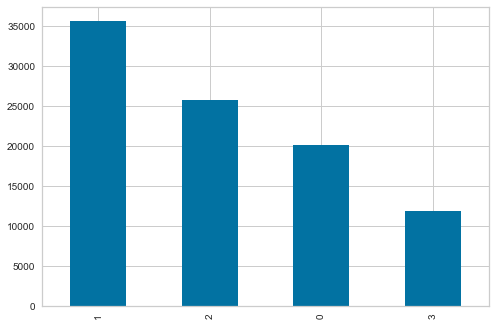

In [561]:
X_kmeans_k4['cluster'].value_counts().plot(kind="bar")
plt.show()

In [445]:
print('Scores pour le modèle kmeans (k=4):')
print('Silhouette Score : ', silhouette_score(X_scaled, X_lab_k4))
print('Davies Bouldin Score : ', davies_bouldin_score(X_scaled, X_lab_k4))
print('Calinski Harabasz Score : ', calinski_harabasz_score(X_scaled,
                                                            X_lab_k4))

Scores pour le modèle kmeans (k=4):
Silhouette Score :  0.3822852286421737
Davies Bouldin Score :  0.9653031788087589
Calinski Harabasz Score :  83242.24580047058


In [491]:
# Export du modèle
with open('models/kmeans_select_final', 'wb') as f1:
    pickle.dump(mod_X_final_k4, f1)